In [1]:
pip install pandas

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import csv
from ast import literal_eval

try:
    df = pd.read_csv(
        '/Users/nikita/Downloads/cv_sample_5.csv',
        sep='|',
        engine='python',
        quoting=csv.QUOTE_ALL,  
        on_bad_lines='warn'
    )
except:
    
    data = []
    with open('/Users/nikita/Downloads/cv_sample_5.csv', 'r', encoding='utf-8') as f:
        reader = csv.reader(f, delimiter='|', quoting=csv.QUOTE_ALL)
        header = next(reader)
        for row in reader:
            if len(row) == len(header):
                data.append(row)

    df = pd.DataFrame(data, columns=header)


df.columns = [col.strip() for col in df.columns]


cols_to_drop = [
    'candidateId', 'stateRegionCode', 'locality',
    'worldskillsInspectionStatus', 'abilympicsInspectionStatus',
    'abilympicsParticipation', 'volunteersInspectionStatus',
    'volunteersParticipation', 'narkInspectionStatus',
    'codeExternalSystem', 'salaryMin', 'salaryMax',
    'shifts', 'businessActivities', 'certifyingDocuments',
    'additionalInformation', 'worldskills'
]

df = df.drop(columns=[col for col in cols_to_drop if col in df.columns])


def parse_json_field(x):
    if pd.isna(x) or str(x).strip() in ('[]', '{}', ''):
        return []
    try:
        return literal_eval(str(x).replace("'", '"'))
    except:
        return x


json_cols = ['educationList', 'workExperienceList', 'languageKnowledge', 'country']
for col in json_cols:
    if col in df.columns:
        df[col] = df[col].apply(parse_json_field)


print(f"Successfully loaded {len(df)} records")
print("Sample data:")
print(df.iloc[0][['id', 'positionName', 'age', 'salary']])

/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/2258422956.py:7: ParserWarning: Skipping line 20025: '|' expected after '"'

  df = pd.read_csv(
/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/2258422956.py:7: ParserWarning: Skipping line 25882: '|' expected after '"'

  df = pd.read_csv(
/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/2258422956.py:7: ParserWarning: Skipping line 32859: '|' expected after '"'

  df = pd.read_csv(
/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/2258422956.py:7: ParserWarning: Skipping line 34108: '|' expected after '"'

  df = pd.read_csv(
/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/2258422956.py:7: ParserWarning: Skipping line 42303: '|' expected after '"'

  df = pd.read_csv(
/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/2258422956.py:7: ParserWarning: Skipping line 46487: '|' expected after '"'

  df = pd.read_csv(
/var/folders/5l/h64trng118s0zqqq9x

Successfully loaded 510709 records
Sample data:
id              1989bdb0-eb28-11ed-a58c-e57b87a63fa7
positionName                       Подсобный-рабочий
age                                             18.0
salary                                        4000.0
Name: 0, dtype: object


In [3]:
df.head(20)

,id,localityName,birthday,gender,age,positionName,dateCreate,typicalPosition,dateModify,publishedDate,...,workExperienceList,scheduleType,salary,busyType,retrainingCapability,businessTrip,languageKnowledge,relocation,innerInfo,education
0,1989bdb0-eb28-11ed-a58c-e57b87a63fa7,"Краснодарский-край,-г-Краснодар",2007-01-18T15:00:00+0300,Женский,18.0,Подсобный-рабочий,2023-05-05T12:34:57+0300,NaN,2023-05-05T12:34:57+0300,2023-05-05T13:07:46+0300,...,[],Полный-рабочий-день,4000.0,NaN,Не-готов-к-переобучению,Не-готов-к-командировкам,"[{'codeLanguage': 'Русский', 'level': 'A1 — на...",Не-готов-к-переезду,"{""idUser"": ""3c00ff60-90ff-11ea-8aed-5d9e90ab95...",Среднее
1,19899120-c052-11ec-bdf7-550ed7335bbe,"Красноярский-край,-г-Енисейск",1980-02-08T00:00:00+0300,Женский,45.0,Мастер-педикюра-(подолог),2022-04-20T05:32:18+0300,NaN,2022-04-20T05:32:18+0300,2022-04-20T05:35:17+0300,...,"[{""companyName"": ""МКУ \""Централизованная бухга...",Полный-рабочий-день,30000.0,NaN,Не-готов-к-переобучению,Не-готов-к-командировкам,"[{'codeLanguage': 'Английский', 'level': 'B2 —...",Не-готов-к-переезду,"{""idUser"": ""1ea17e00-31e5-11e5-abfd-1ff7059456...",Высшее-бакалавриат
2,19897120-929d-11ea-9ce6-239861b1f67b,"Курганская-область,-г-Курган",1989-02-24T00:00:00+0300,Мужской,36.0,подсобный-рабочий,2020-05-10T12:03:22+0300,NaN,2020-05-10T12:47:23+0300,2020-05-10T20:58:56+0300,...,"[{""achievements"": ""нет"", ""companyName"": ""АО НП...",Полный-рабочий-день,12000.0,NaN,Готов-к-переобучению,Не-готов-к-командировкам,"[{'codeLanguage': 'Русский', 'level': 'C2 — в ...",Не-готов-к-переезду,"{""idUser"": ""9d6dcfa0-02af-11e5-85f7-1ff7059456...",Среднее
3,19896340-195a-11ef-b346-e7f46f7514cd,"Сахалинская-область,-Корсаковский-район,-Чапае...",2009-08-21T16:00:00+0400,Мужской,15.0,подсобный-рабочий,2024-05-24T02:13:43+0300,NaN,2024-05-24T02:13:43+0300,2024-06-28T01:53:59+0300,...,[],Неполный-рабочий-день/неполная-рабочая-неделя,8000.0,NaN,Не-готов-к-переобучению,Не-готов-к-командировкам,[],Не-готов-к-переезду,"{""rfCitizen"": ""Соискатель является гражданином...",NaN
4,19894575-f7eb-11e5-b72a-037acc02728d,"Крым-республика,-Симферопольский-район,-Гварде...",NaN,Мужской,NaN,продавец,2017-02-21T22:00:23+0300,NaN,2016-04-01T12:21:22+0300,2016-04-01T12:23:18+0300,...,[],Полный-рабочий-день,18000.0,NaN,Не-готов-к-переобучению,Не-готов-к-командировкам,[],Не-готов-к-переезду,"{""idUser"": ""bc118eb0-1fbf-11e5-8442-1ff7059456...",NaN
5,19893ca0-d26c-11ef-94af-e7f46f7514cd,"Нижегородская-область,-Воскресенский-район,-Во...",1967-08-27T15:00:00+0300,Мужской,57.0,сторож,2025-01-14T14:38:39+0300,NaN,2025-01-14T14:38:40+0300,2025-01-14T14:57:34+0300,...,"[{""companyName"": ""ГБУ НО Государственное ветер...",Полный-рабочий-день,25000.0,NaN,Не-готов-к-переобучению,Не-готов-к-командировкам,[],Не-готов-к-переезду,"{""rfCitizen"": ""Соискатель является гражданином...",Среднее-профессиональное
6,19892410-af1a-11ea-9886-ef76bd2a03c1,"Иркутская-область,-г-Зима",1989-05-22T00:00:00+0400,Мужской,35.0,Водитель-автомобиля,2020-06-15T18:08:42+0300,NaN,2020-06-15T18:08:42+0300,2020-06-17T04:03:21+0300,...,"[{""companyName"": ""Ооо \""СоЭнерго +\"""", ""dateFr...",Сменная-работа,40000.0,NaN,Готов-к-переобучению,Готов-к-командировкам,[],Не-готов-к-переезду,"{""idUser"": ""41d61340-1633-11e5-b612-1ff7059456...",Среднее
7,19891aa0-3749-11ee-b7ad-336eacb7e7a3,"Кемеровская-область---Кузбасс-область,-Таштаго...",2007-09-05T16:00:00+0400,Женский,17.0,подсобный-рабочий,2023-08-10T09:42:39+0300,NaN,2023-08-10T09:42:39+0300,2023-08-10T09:43:19+0300,...,[],Неполный-рабочий-день/неполная-рабочая-неделя,10000.0,NaN,Не-готов-к-переобучению,Не-готов-к-командировкам,[],Не-готов-к-переезду,"{""idUser"": ""e64aa610-7b0b-11ea-9fd7-5d9e90ab95...",NaN
8,1988ef20-1cbb-11ed-ab42-457e0ebd778e,"Нижегородская-область,-Краснобаковский-район,-...",2000-08-25T00:00:00+0400,Мужской,24.0,Инженер-проектировщик,2022-08-15T19:55:43+0300,NaN,2022-08-15T20:20:30+0300,2022-08-16T10:04:42+0300,...,[],Полный-рабочий-день,35000

In [ ]:

for col in df.columns:
    if df[col].apply(lambda x: isinstance(x, list)).any():
        df[col] = df[col].astype(str)

 
df = df.dropna(subset=['age', 'experience', 'salary'])
df = df[(df['age'] >= 16) & (df['age'] <= 70)]
df = df[df['salary'] <= 800000]
df = df[df['experience'] <= 60]
df = df[df['workExperienceList'].apply(lambda x: str(x).strip() != '[]')]
    
df = df.dropna(axis=1, thresh=0.1*len(df))

In [ ]:
import re

def extract_region(locality):
    if not isinstance(locality, str):
        return 'Неизвестно'
    
    patterns = [
        r'([\wёЁ\-]+?)\s*край',
        r'([\wёЁ\-]+?)\s*область',
        r'республика\s*([\wёЁ\-]+)',
        r'([\wёЁ\-]+?)\s*автономный\s*округ',
        r'([\wёЁ\-]+?)\s*республика',
        r'г[-–]\s*([\wёЁ\-]+)',
        
    ]
    
    for pattern in patterns:
        match = re.search(pattern, locality.lower())
        if match:
            return match.group(1).capitalize()
    
    return 'Неизвестно'


df['region'] = df['localityName'].apply(extract_region)


print(df[['localityName', 'region']].sample(15))


                                             localityName  \
272578                                   Брянская-область   
316759                                 Московская-область   
481679  Ставропольский-край,-Ипатовский-район,-Малый-Б...   
324563                   Ульяновская-область,-г-Ульяновск   
169385  Краснодарский-край,-Калининский-район,-Калинин...   
212233  Дагестан-республика,-Хасавюртовский-район,-Сол...   
408941                                 Московская-область   
222030  Ханты-Мансийский-Автономный-округ---Югра-автон...   
419737                  Ставропольский-край,-г-Ставрополь   
262915  Хакасия-республика,-Орджоникидзевский-район,-К...   
8853                     Свердловская-область,-г-Камышлов   
485588                                 Московская-область   
159703              Бурятия-республика,-г-Северобайкальск   
206668  Татарстан-республика,-Муслюмовский-район,-Миха...   
136460                        Рязанская-область,-г-Рязань   

                       

In [6]:
df['region'].value_counts()

region
Московская-        13490
Москва             13317
Краснодарский-     12018
Санкт-петербург    11048
Свердловская-      10293
                   ...  
Запорожская-          13
Херсонская-           12
Билибино              10
Певек                  4
Село                   2
Name: count, Length: 101, dtype: int64

In [ ]:
df = df[
    df['workExperienceList'].apply(
        lambda x: (
            x is not None  
            and str(x).strip() != '[]'  
            and (len(x) > 0 if isinstance(x, list) else True)  
        )
    )
]

In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
import ast

def calculate_years_since_graduation(df, education_col='educationList'):
    """
    Calculate years since graduation from education records.
    Returns a Series with years since graduation (NaN for missing/invalid data).
    """
    current_year = datetime.now().year
    years_since_graduation = pd.Series(np.nan, index=df.index)

    for idx, edu_str in df[education_col].items():
        try:
            if pd.isna(edu_str) or edu_str == '[]':
                continue

            # Parse string to list
            if isinstance(edu_str, str):
                edu_list = ast.literal_eval(edu_str)
            else:
                edu_list = edu_str

            if not isinstance(edu_list, list):
                continue

            grad_years = []
            for edu in edu_list:
                if isinstance(edu, dict) and 'graduateYear' in edu:
                    try:
                        grad_years.append(int(edu['graduateYear']))
                    except (ValueError, TypeError):
                        continue

            if grad_years:
                latest_grad_year = max(grad_years)
                years_since_graduation[idx] = current_year - latest_grad_year

        except:
            continue

    return years_since_graduation


df['years_since_graduation'] = calculate_years_since_graduation(df)


df = df[df['scheduleType'] == 'Полный-рабочий-день']


df = df[((df['years_since_graduation'] >= 0) & (df['years_since_graduation'] <= 60)) | df['years_since_graduation'].isna()]


In [ ]:
import pandas as pd
import numpy as np
from IPython.display import display
from collections import Counter
import ast
from datetime import datetime

def calculate_years_since_graduation(df, education_col='educationList'):
    current_year = datetime.now().year
    years_since_graduation = pd.Series(np.nan, index=df.index)

    for idx, edu_str in df[education_col].items():
        try:
            if pd.isna(edu_str) or edu_str == '[]':
                continue
            edu_list = ast.literal_eval(edu_str) if isinstance(edu_str, str) else edu_str
            if not isinstance(edu_list, list):
                continue
            grad_years = [int(e['graduateYear']) for e in edu_list if isinstance(e, dict) and 'graduateYear' in e]
            if grad_years:
                years_since_graduation[idx] = current_year - max(grad_years)
        except:
            continue
    return years_since_graduation

def show_descriptive_stats(df, max_categories=10):
    if 'educationList' in df.columns:
        df['years_since_graduation'] = calculate_years_since_graduation(df)

    for col in df.columns:
        if df[col].apply(lambda x: isinstance(x, (list, dict))).any():
            df[col] = df[col].astype(str)

   
    df = df[df['scheduleType'] == 'Полный-рабочий-день']

    
    df = df[(df['years_since_graduation'].between(0, 60)) | (df['years_since_graduation'].isna())]

    numeric_stats = pd.DataFrame()
    categorical_dfs = []

    numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
    if numeric_cols:
        numeric_stats = df[numeric_cols].describe().transpose()
        numeric_stats['skew'] = df[numeric_cols].skew()
        numeric_stats['kurtosis'] = df[numeric_cols].kurtosis()
        numeric_stats['zeros'] = (df[numeric_cols] == 0).sum()
        numeric_stats['missing'] = df[numeric_cols].isna().sum()

    categorical_cols = [col for col in df.select_dtypes(include=['object', 'category']).columns if col != 'softSkills']
    for col in categorical_cols:
        try:
            if df[col].isna().mean() > 0.9:
                continue
            value_counts = df[col].value_counts(dropna=True)
            total_non_missing = value_counts.sum()
            top_values = value_counts if len(value_counts) <= max_categories else pd.concat([
                value_counts.head(max_categories),
                pd.Series({'Other': value_counts[max_categories:].sum()})
            ])
            percentages = (top_values / total_non_missing * 100).round(1)
            combined = pd.DataFrame({
                'Category': top_values.index,
                'Count': top_values.values,
                'Percent': percentages.values,
                'Variable': col
            })
            categorical_dfs.append(combined)
        except:
            continue

    
    if 'softSkills' in df.columns:
        skill_counter = Counter()
        total_entries = 0
        for skills_str in df['softSkills'].dropna():
            try:
                if isinstance(skills_str, str):
                    skills_list = ast.literal_eval(skills_str) if skills_str.startswith('[') else [skills_str]
                else:
                    skills_list = skills_str
                if not skills_list or skills_list == ['']:
                    continue
                total_entries += 1
                for skill in skills_list:
                    if skill and str(skill).strip():
                        skill_counter[str(skill).strip()] += 1
            except:
                continue
        if skill_counter:
            skills_df = pd.DataFrame.from_dict(skill_counter, orient='index', columns=['Count']).sort_values('Count', ascending=False)
            skills_df['Percent'] = (skills_df['Count'] / total_entries * 100).round(1)
            skills_df.index.name = 'Skill'
            skills_df.reset_index(inplace=True)
            if len(skills_df) > max_categories:
                top_skills = skills_df.head(max_categories)
                other_row = pd.DataFrame({
                    'Skill': ['Other'],
                    'Count': [skills_df['Count'][max_categories:].sum()],
                    'Percent': [skills_df['Percent'][max_categories:].sum()]
                })
                skills_df = pd.concat([top_skills, other_row], ignore_index=True)
            skills_df['Variable'] = 'softSkills'
            categorical_dfs.append(skills_df.rename(columns={'Skill': 'Category'})[['Variable', 'Category', 'Count', 'Percent']])

    print("═" * 80)
    print("📊 COMPREHENSIVE DESCRIPTIVE STATISTICS".center(80))
    print("═" * 80)

    if not numeric_stats.empty:
        print("\nNUMERIC VARIABLES:")
        try:
            numeric_stats = numeric_stats[~numeric_stats.index.duplicated()]
            display(numeric_stats.style
                    .format("{:.1f}")
                    .background_gradient(cmap='Blues', subset=['mean', '50%'])
                    .background_gradient(cmap='Reds', subset=['missing']))
        except:
            display(numeric_stats)
    else:
        print("\nNo numeric variables found")

    if categorical_dfs:
        print("\nCATEGORICAL VARIABLES:")
        for var_df in categorical_dfs:
            print(f"\nVariable: {var_df['Variable'].iloc[0]}")
            display(var_df[['Category', 'Count', 'Percent']])
    else:
        print("\nNo categorical variables found")

    print("\n" + "═" * 80)
    print("SUMMARY STATISTICS".center(80))
    print(f"Total variables: {len(df.columns)}")
    print(f"Numeric variables: {len(numeric_cols)}")
    print(f"Categorical variables: {len(categorical_cols)}")
    print(f"Total records: {len(df):,}")
    if 'educationList' in df.columns:
        valid_grad_years = df['years_since_graduation'].notna().sum()
        print(f"Records with graduation data: {valid_grad_years:,} ({valid_grad_years / len(df) * 100:.1f}%)")
    if 'softSkills' in df.columns:
        print(f"Records with skills data: {total_entries:,}")
    print("═" * 80)


show_descriptive_stats(df)

════════════════════════════════════════════════════════════════════════════════
                     📊 COMPREHENSIVE DESCRIPTIVE STATISTICS                     
════════════════════════════════════════════════════════════════════════════════

NUMERIC VARIABLES:


,count,mean,std,min,25%,50%,75%,max,skew,kurtosis,zeros,missing
age,262357.0,41.9,10.6,16.0,34.0,41.0,50.0,70.0,0.2,-0.7,0.0,0.0
experience,262357.0,6.2,7.2,0.0,1.0,3.0,9.0,59.0,1.8,3.7,34314.0,0.0
salary,262357.0,39904.3,31479.2,0.0,25000.0,30000.0,50000.0,800000.0,6.0,73.5,169.0,0.0
years_since_graduation,227887.0,19.8,11.3,0.0,11.0,18.0,27.0,60.0,0.5,-0.5,793.0,34470.0



CATEGORICAL VARIABLES:

Variable: id


,Category,Count,Percent
0,062e49f0-f5b4-11ef-99f4-716c765c9fe3,1,0.0
1,19899120-c052-11ec-bdf7-550ed7335bbe,1,0.0
2,19897120-929d-11ea-9ce6-239861b1f67b,1,0.0
3,19893ca0-d26c-11ef-94af-e7f46f7514cd,1,0.0
4,19886bb0-bb9a-11ea-a008-f3e0740405b3,1,0.0
5,753a3350-d3a0-11ed-a5e8-af80dfa0be97,1,0.0
6,7ad72940-659f-11ed-a1b4-27c2a54abdc4,1,0.0
7,803f0300-3055-11ed-9aa5-fdf9f86d256a,1,0.0
8,91bcf4f0-b129-11ef-ae42-716c765c9fe3,1,0.0
9,9833c100-3b38-11ee-8702-d53cd48f29e6,1,0.0



Variable: localityName


,Category,Count,Percent
0,г-Москва,10533,4.0
1,г-Санкт-Петербург,7868,3.0
2,Московская-область,6436,2.5
3,"Новосибирская-область,-г-Новосибирск",2707,1.0
4,"Краснодарский-край,-г-Краснодар",2391,0.9
5,"Свердловская-область,-г-Екатеринбург",2312,0.9
6,"Пермский-край,-г-Пермь",2294,0.9
7,"Башкортостан-республика,-г-Уфа",2271,0.9
8,"Красноярский-край,-г-Красноярск",2233,0.9
9,"Татарстан-республика,-г-Казань",2086,0.8



Variable: birthday


,Category,Count,Percent
0,1989-01-18T00:00:00+0300,32,0.0
1,1965-01-01T00:00:00+0300,32,0.0
2,1966-01-01T00:00:00+0300,32,0.0
3,1988-07-11T00:00:00+0400,32,0.0
4,1961-01-01T00:00:00+0300,31,0.0
5,1983-07-03T00:00:00+0400,31,0.0
6,1986-07-26T00:00:00+0400,30,0.0
7,1987-01-30T00:00:00+0300,30,0.0
8,1989-01-09T00:00:00+0300,29,0.0
9,1987-11-18T00:00:00+0300,29,0.0



Variable: gender


,Category,Count,Percent
0,Женский,149798,57.1
1,Мужской,112559,42.9



Variable: positionName


,Category,Count,Percent
0,Бухгалтер,5681,2.2
1,Администратор,5601,2.1
2,Специалист,5264,2.0
3,Менеджер,5183,2.0
4,Водитель,4356,1.7
5,Продавец,4076,1.6
6,Повар,2486,0.9
7,водитель,2379,0.9
8,Экономист,2328,0.9
9,Юрист,2302,0.9



Variable: dateCreate


,Category,Count,Percent
0,2020-04-13T12:01:33+0300,3,0.0
1,2020-04-15T12:56:38+0300,3,0.0
2,2020-04-22T16:39:59+0300,3,0.0
3,2020-04-23T12:57:55+0300,3,0.0
4,2020-05-08T11:22:47+0300,2,0.0
5,2025-01-28T07:54:33+0300,2,0.0
6,2021-12-16T07:30:57+0300,2,0.0
7,2023-01-31T14:25:30+0300,2,0.0
8,2020-05-18T10:34:14+0300,2,0.0
9,2022-12-08T12:52:06+0300,2,0.0



Variable: dateModify


,Category,Count,Percent
0,2020-04-30T16:01:41+0300,3,0.0
1,2020-04-23T12:57:55+0300,3,0.0
2,2023-01-31T14:25:30+0300,2,0.0
3,2020-05-18T10:34:14+0300,2,0.0
4,2020-05-12T13:26:02+0300,2,0.0
5,2022-08-13T16:58:20+0300,2,0.0
6,2020-04-18T18:40:49+0300,2,0.0
7,2020-11-18T10:23:47+0300,2,0.0
8,2020-04-13T11:37:06+0300,2,0.0
9,2022-07-12T10:12:14+0300,2,0.0



Variable: publishedDate


,Category,Count,Percent
0,2020-04-16T12:18:40+0300,3,0.0
1,2022-06-09T15:03:06+0300,3,0.0
2,2020-04-23T14:27:08+0300,3,0.0
3,2020-04-15T09:09:51+0300,3,0.0
4,2020-04-15T09:13:54+0300,3,0.0
5,2021-09-02T11:49:35+0300,2,0.0
6,2020-04-17T09:29:24+0300,2,0.0
7,2020-04-17T13:42:07+0300,2,0.0
8,2023-06-08T10:30:41+0300,2,0.0
9,2022-06-15T08:59:19+0300,2,0.0



Variable: skills


,Category,Count,Percent
0,[],260473,99.3
1,"[""Ответственность , добросовестность"", ""Ответс...",33,0.0
2,"[""Знание работы с компьютером"", ""Умение делать...",5,0.0
3,"[""Знание работы с компьютером"", ""Знание работы...",5,0.0
4,"[""Умение работать с клиентами"", ""Умение работа...",5,0.0
5,"[""Коммуникабельность"", ""Коммуникабельность""]",4,0.0
6,"[""Управление автомобилем /вождение автомобиля""...",4,0.0
7,"[""Умение работать в команде"", ""Умение работать...",4,0.0
8,"[""Персональный компьютер (ПК) / Ноутбук"", ""Дис...",3,0.0
9,"[""Выносливость, высокая работоспособность"", ""В...",3,0.0



Variable: driveLicenses


,Category,Count,Percent
0,[],197078,75.1
1,"[""B""]",46978,17.9
2,"[""B"", ""C""]",9950,3.8
3,"[""A"", ""B"", ""C""]",2302,0.9
4,"[""A"", ""B""]",2003,0.8
5,"[""D"", ""B"", ""C""]",1853,0.7
6,"[""A"", ""B"", ""C"", ""D""]",1113,0.4
7,"[""C""]",408,0.2
8,"[""A""]",303,0.1
9,"[""D"", ""B""]",155,0.1



Variable: country


,Category,Count,Percent
0,"[{'countryName': 'Российская Федерация', 'coun...",262010,99.9
1,"[{'countryName': 'Украина', 'countryCode': 'UA'}]",140,0.1
2,"[{'countryName': 'Республика Казахстан', 'coun...",89,0.0
3,"[{'countryName': 'Республика Беларусь', 'count...",29,0.0
4,"[{'countryName': 'Республика Узбекистан', 'cou...",20,0.0
5,"[{'countryName': 'Иное', 'countryCode': 'OT'}]",19,0.0
6,"[{'countryName': 'Республика Таджикистан', 'co...",14,0.0
7,"[{'countryName': 'Республика Армения', 'countr...",11,0.0
8,"[{'countryName': 'Без гражданства', 'countryCo...",7,0.0
9,"[{'countryName': 'Республика Молдова', 'countr...",5,0.0



Variable: educationList


,Category,Count,Percent
0,[{'type': 'Education'}],22205,8.5
1,[],11118,4.2
2,"[{'speciality': 'Биология', 'type': 'Education'}]",230,0.1
3,"[{'speciality': 'Гуманитарные науки', 'type': ...",207,0.1
4,"[{'speciality': 'Строительство железных дорог,...",55,0.0
5,"[{'graduateYear': 2003, 'type': 'Education'}]",54,0.0
6,"[{'graduateYear': 2002, 'type': 'Education'}]",38,0.0
7,"[{'graduateYear': 2000, 'type': 'Education'}]",37,0.0
8,"[{'graduateYear': 2006, 'type': 'Education'}]",36,0.0
9,"[{'graduateYear': 2008, 'type': 'Education'}]",35,0.0



Variable: additionalEducationList


,Category,Count,Percent
0,[],230050,87.7
1,"[{""type"": ""Course""}]",548,0.2
2,"[{""organization"": ""нет"", ""type"": ""Course""}]",93,0.0
3,"[{""organization"": ""Нет"", ""type"": ""Course""}]",74,0.0
4,"[{""organization"": ""-"", ""type"": ""Course""}]",63,0.0
5,"[{""graduateYear"": 2023, ""organization"": ""Томск...",14,0.0
6,"[{""graduateYear"": 2023, ""organization"": ""РАНХи...",12,0.0
7,"[{""graduateYear"": 2022, ""organization"": ""РАНХи...",12,0.0
8,"[{""graduateYear"": 2019, ""organization"": ""РАНХи...",11,0.0
9,"[{""graduateYear"": 2021, ""organization"": ""РАНХи...",10,0.0



Variable: hardSkills


,Category,Count,Percent
0,[],221929,84.6
1,"[""умение работать в команде""]",3166,1.2
2,"[""ответственность за достижение результата""]",1441,0.5
3,"[""коммуникабельность""]",722,0.3
4,"[""ответственность""]",577,0.2
5,"[""стремление к профессиональному и карьерному ...",562,0.2
6,"[""ответственный подход к работе""]",556,0.2
7,"[""умение работать с документами""]",356,0.1
8,"[""соблюдение трудовой дисциплины""]",341,0.1
9,"[""решение административных вопросов""]",309,0.1



Variable: workExperienceList


,Category,Count,Percent
0,"[{""relevant"": false, ""type"": ""WorkExperience"",...",129,0.0
1,"[{""companyName"": ""Макслевел"", ""dateFrom"": ""201...",14,0.0
2,"[{""companyName"": ""АО \""Тендер\"""", ""dateFrom"": ...",11,0.0
3,"[{""achievements"": ""Компания работала с 0 . До ...",9,0.0
4,"[{""companyName"": ""ООО ПОРАНАЙ"", ""dateFrom"": ""2...",8,0.0
5,"[{""companyName"": ""ООО \""УК\""БЕРЕСТА\"""", ""dateF...",8,0.0
6,"[{""achievements"": ""Неоднократно выделялась рук...",8,0.0
7,"[{""companyName"": ""Отель АО \""Олимпия\"""", ""date...",7,0.0
8,"[{""companyName"": ""ООО КР ГРУПП"", ""dateFrom"": ""...",7,0.0
9,"[{""companyName"": ""Ооо \""ГК Урал\"""", ""dateFrom""...",7,0.0



Variable: scheduleType


,Category,Count,Percent
0,Полный-рабочий-день,262357,100.0



Variable: retrainingCapability


,Category,Count,Percent
0,Готов-к-переобучению,151641,57.8
1,Не-готов-к-переобучению,110716,42.2



Variable: businessTrip


,Category,Count,Percent
0,Не-готов-к-командировкам,195656,74.6
1,Готов-к-командировкам,66701,25.4



Variable: languageKnowledge


,Category,Count,Percent
0,[],116503,44.4
1,"[{'codeLanguage': 'Русский', 'level': 'C2 — в ...",45842,17.5
2,"[{'codeLanguage': 'Английский', 'level': 'A1 —...",25974,9.9
3,"[{'codeLanguage': 'Русский', 'level': 'A1 — на...",21429,8.2
4,"[{'codeLanguage': 'Английский', 'level': 'B2 —...",15350,5.9
5,"[{'codeLanguage': 'Английский', 'level': 'B2 —...",4027,1.5
6,"[{'codeLanguage': 'Английский', 'level': 'A1 —...",3873,1.5
7,"[{'codeLanguage': 'Немецкий', 'level': 'A1 — н...",3632,1.4
8,"[{'codeLanguage': 'Английский', 'level': 'C1 —...",3551,1.4
9,"[{'codeLanguage': 'Немецкий', 'level': 'B2 — с...",2391,0.9



Variable: relocation


,Category,Count,Percent
0,Не-готов-к-переезду,246923,94.1
1,Готов-к-переезду,15434,5.9



Variable: innerInfo


,Category,Count,Percent
0,"{""rfCitizen"": ""Соискатель является гражданином...",2,0.0
1,"{""idUser"": ""6ef4c030-7b08-11ea-9fd7-5d9e90ab95...",2,0.0
2,"{""idUser"": ""73d53a30-7d24-11ea-9a6b-dbfd80b8ec...",2,0.0
3,"{""rfCitizen"": ""Соискатель является гражданином...",2,0.0
4,"{""rfCitizen"": ""Соискатель является гражданином...",2,0.0
5,"{""rfCitizen"": ""Соискатель является гражданином...",2,0.0
6,"{""rfCitizen"": ""Соискатель является гражданином...",2,0.0
7,"{""rfCitizen"": ""Соискатель является гражданином...",2,0.0
8,"{""idUser"": ""db6190e0-4af8-11e9-8048-5d9e90ab95...",2,0.0
9,"{""rfCitizen"": ""Соискатель является гражданином...",2,0.0



Variable: education


,Category,Count,Percent
0,Высшее-бакалавриат,94227,41.1
1,Среднее-общее,84077,36.7
2,Среднее,44847,19.6
3,Среднее-профессиональное,1919,0.8
4,Нет-основного-общего,1246,0.5
5,Основное-общее,1083,0.5
6,"Высшее-специалитет,-магистратура",987,0.4
7,Высшее-подготовка-кадров-высшей-квалификации,521,0.2
8,Высшее,171,0.1
9,Незаконченное-высшее,1,0.0



Variable: region


,Category,Count,Percent
0,Москва,11615,4.4
1,Московская-,10941,4.2
2,Краснодарский-,10245,3.9
3,Санкт-петербург,9133,3.5
4,Свердловская-,8598,3.3
5,Башкортостан-,7762,3.0
6,Пермский-,7542,2.9
7,Челябинская-,7259,2.8
8,Красноярский-,6948,2.6
9,Ростовская-,6939,2.6



Variable: softSkills


,Category,Count,Percent
0,Работа в команде,6095,33.9
1,Работоспособность,1957,10.9
2,Умение находить общий язык с клиентами,1515,8.4
3,Умение расставлять приоритеты,1403,7.8
4,Организаторские навыки,1294,7.2
5,Умение работать с большим объемом информации,1205,6.7
6,Внимательность к деталям,1166,6.5
7,Нацеленность на результат,1149,6.4
8,Умение организовать рабочий процесс,1137,6.3
9,Грамотная речь,1122,6.2



════════════════════════════════════════════════════════════════════════════════
                               SUMMARY STATISTICS                               
Total variables: 28
Numeric variables: 4
Categorical variables: 23
Total records: 262,357
Records with graduation data: 227,887 (86.9%)
Records with skills data: 17,969
════════════════════════════════════════════════════════════════════════════════


In [10]:
df_full = df
df = df_full.sample(frac=0.15, random_state=42).reset_index(drop=True)

In [ ]:
import pandas as pd
import numpy as np
import json
from datetime import datetime

def parse_json_column(df, column_name):
    """Parse JSON strings in a DataFrame column into Python objects."""
    parsed_data = []
    for item in df[column_name]:
        if isinstance(item, str):
            try:
                parsed_data.append(json.loads(item))
            except (json.JSONDecodeError, TypeError):
                parsed_data.append(None)
        else:
            parsed_data.append(item)
    return parsed_data

def months_between(end_date, start_date):
    """Calculate the number of months between two dates."""
    return ((end_date - start_date).days) / 30.44  

def extract_all_work_features(df, max_jobs=5):
    df = df.copy()
    today = pd.Timestamp.now(tz='UTC')
    df['workExperienceList'] = parse_json_column(df, 'workExperienceList')

    
    n = len(df)
    first_job_months_ago = [np.nan] * n
    total_experience_years = [np.nan] * n
    current_job_duration_months = [np.nan] * n
    avg_job_duration_months = [np.nan] * n
    job_change_frequency = [np.nan] * n
    career_gaps_count = [np.nan] * n
    is_manager_flags = [0] * n
    num_jobs_list = [0] * n

    position_data = {f'position_{i}_{feat}': [np.nan] * n for i in range(1, max_jobs + 1) for feat in [
        'title', 'company', 'start_months_ago', 'end_months_ago', 'duration_months'
    ]}
    gap_data = {f'gap_before_position_{i}_months': [np.nan] * n for i in range(2, max_jobs + 1)}

    manager_keywords = ['manager', 'director', 'head', 'руководитель', 'директор', 'управляющий', 'начальник']

    for idx, exp_list in enumerate(df['workExperienceList']):
        try:
            if not exp_list or not isinstance(exp_list, list):
                continue

            jobs = sorted(
                [j for j in exp_list if 'dateFrom' in j],
                key=lambda x: pd.to_datetime(x['dateFrom'], utc=True),
                reverse=True
            )
            if len(jobs) == 0:
                continue

            num_jobs = len(jobs)
            num_jobs_list[idx] = num_jobs

           
            oldest = min(jobs, key=lambda x: pd.to_datetime(x['dateFrom'], utc=True))
            first_job_months_ago[idx] = months_between(today, pd.to_datetime(oldest['dateFrom'], utc=True))

            
            total_months = 0
            durations = []
            start_dates = []
            end_dates = []

            for job in jobs:
                start = pd.to_datetime(job['dateFrom'], utc=True)
                end = pd.to_datetime(job.get('dateTo', today), utc=True)
                duration = months_between(end, start)
                durations.append(duration)
                start_dates.append(start)
                end_dates.append(end)
                total_months += duration

            total_experience_years[idx] = total_months / 12
            avg_job_duration_months[idx] = np.mean(durations) if durations else np.nan
            job_change_frequency[idx] = num_jobs / (total_months / 12) if total_months else np.nan

            # Gaps
            gaps = [months_between(start_dates[i - 1], end_dates[i])
                    for i in range(1, len(start_dates)) if months_between(start_dates[i - 1], end_dates[i]) > 1.5]
            career_gaps_count[idx] = len(gaps)

            # Current job
            current_start = pd.to_datetime(jobs[0]['dateFrom'], utc=True)
            current_end = pd.to_datetime(jobs[0].get('dateTo', today), utc=True)
            current_job_duration_months[idx] = months_between(current_end, current_start)

            # Manager title
            title = jobs[0].get('jobTitle', '').lower()
            is_manager_flags[idx] = int(any(kw in title for kw in manager_keywords))

            # Per-position
            for i in range(max_jobs):
                if i < num_jobs:
                    job = jobs[i]
                    start = pd.to_datetime(job.get('dateFrom', today), utc=True)
                    end = pd.to_datetime(job.get('dateTo', today), utc=True)
                    position_data[f'position_{i+1}_title'][idx] = job.get('jobTitle')
                    position_data[f'position_{i+1}_company'][idx] = job.get('companyName')
                    position_data[f'position_{i+1}_start_months_ago'][idx] = months_between(today, start)
                    position_data[f'position_{i+1}_end_months_ago'][idx] = months_between(today, end)
                    position_data[f'position_{i+1}_duration_months'][idx] = months_between(end, start)

            # Gaps between jobs
            for i in range(1, max_jobs):
                if i < len(jobs):
                    prev_end = pd.to_datetime(jobs[i]['dateTo'], utc=True) if jobs[i].get('dateTo') else today
                    curr_start = pd.to_datetime(jobs[i-1]['dateFrom'], utc=True)
                    gap_months = months_between(curr_start, prev_end)
                    gap_data[f'gap_before_position_{i+1}_months'][idx] = gap_months if gap_months > 1.5 else 0

        except Exception as e:
            print(f"⚠️ Error on index {idx}: {e}")
            continue

   
    df['first_job_start_months_ago'] = first_job_months_ago
    df['total_experience_years_calc'] = total_experience_years
    df['current_job_duration_months'] = current_job_duration_months
    df['avg_job_duration_months'] = avg_job_duration_months
    df['job_change_frequency'] = job_change_frequency
    df['career_gaps_count'] = career_gaps_count
    df['is_manager'] = is_manager_flags
    df['num_jobs'] = num_jobs_list

    for col in position_data:
        df[col] = position_data[col]
    for col in gap_data:
        df[col] = gap_data[col]

    return df


df = extract_all_work_features(df)


⚠️ Error on index 20223: Out of bounds nanosecond timestamp: 0012-07-01T00:00:00+0300, at position 0


In [ ]:
def get_months_last_job_and_trim(df):
    today = pd.Timestamp.now(tz='UTC')

    df['workExperienceList'] = parse_json_column(df, 'workExperienceList')

    last_job_months = []
    trimmed_work_experience = []

    for i, exp_list in enumerate(df['workExperienceList']):
        try:
            if not isinstance(exp_list, list) or len(exp_list) == 0:
                raise ValueError("Invalid or empty experience list")

            
            valid_jobs = [j for j in exp_list if 'dateFrom' in j]
            if not valid_jobs:
                raise ValueError("No valid jobs with 'dateFrom'")

            
            sorted_jobs = sorted(valid_jobs, key=lambda x: pd.to_datetime(x['dateFrom'], utc=True), reverse=True)

            last_job = sorted_jobs[0]
            start = pd.to_datetime(last_job['dateFrom'], utc=True)
            end = pd.to_datetime(last_job.get('dateTo', today), utc=True)
            duration_months = (end - start).days / 30.44

            last_job_months.append(duration_months)
            trimmed_work_experience.append(sorted_jobs[1:])  

        except Exception as e:
            last_job_months.append(np.nan)
            trimmed_work_experience.append([])

    df['months_worked_last_job'] = last_job_months
    df['workExperienceList'] = trimmed_work_experience  

    return df
df = get_months_last_job_and_trim(df)
df = extract_all_work_features(df)  

df = df[df['months_worked_last_job'].notna()]
df = df[df['months_worked_last_job'] >= 0]


In [13]:
pip install matplotlib seaborn ipython pandas

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
from rapidfuzz import fuzz
import pandas as pd


categories = {
    'Административный персонал': ['секретарь', 'офис-менеджер', 'делопроизводитель', 'помощник руководителя', 'референт'],
    'Инженеры и технические специалисты': ['инженер', 'технолог', 'системный администратор', 'электрик', 'энергетик', 'наладчик'],
    'Менеджмент и управление': ['менеджер', 'руководитель', 'директор', 'управляющий', 'начальник'],
    'Продажи и маркетинг': ['продавец', 'торговый представитель', 'менеджер по продажам', 'маркетолог', 'smm', 'реклам', 'аккаунт-менеджер'],
    'Бухгалтерия и финансы': ['бухгалтер', 'экономист', 'финансовый', 'кассир', 'аудитор'],
    'Юриспруденция': ['юрист', 'юрисконсульт', 'помощник юриста', 'нотариус'],
    'Образование и воспитание': ['учитель', 'воспитатель', 'преподаватель', 'педагог', 'тьютор'],
    'Медицина': ['врач', 'медсестра', 'фельдшер', 'медик', 'психолог', 'санитар'],
    'Производство и рабочие': ['слесарь', 'монтажник', 'сварщик', 'оператор', 'станочник', 'рабочий', 'повар', 'уборщик', 'швея'],
    'IT и разработка': ['программист', 'разработчик', 'frontend', 'backend', 'аналитик', 'тестировщик', 'data'],
    'Транспорт и логистика': ['водитель', 'диспетчер', 'логист', 'экспедитор', 'курьер', 'кладовщик'],
    'Безопасность': ['охранник', 'инспектор охраны', 'служба безопасности', 'контролер'],
    'Прочее': []
}


def classify_position(title):
    if not isinstance(title, str) or not title.strip():
        return 'Прочее'

    title_clean = title.lower().replace('ё', 'е')
    best_match = ('Прочее', 0)

    for category, keywords in categories.items():
        for keyword in keywords:
            score = fuzz.partial_ratio(keyword, title_clean)
            if score > best_match[1]:
                best_match = (category, score)

    return best_match[0]


df["positionCategory"] = df["positionName"].apply(classify_position)



───────────────────────────── CATEGORICAL ANALYSIS ─────────────────────────────

Top values in id:


id
fc7b1410-97ea-11ee-bc16-c7bd3a8c3ec7    1
4bafdc40-b051-11ee-95c0-c7bd3a8c3ec7    1
3e490a60-8ed0-11ee-943b-716c765c9fe3    1
89890b48-a6ed-11e8-9855-0f468c90bfa7    1
facd19a0-8be1-11eb-a83d-3bfa22f2d66b    1
3b5f5d10-5438-11ec-be57-839f0d9a4379    1
f7ed92a1-30e7-11e7-b5bd-736ab11edb0c    1
1f74af60-0f5d-11ee-88c5-01e20877b34e    1
6be4ca20-9e80-11ea-a7e7-736ab11edb0c    1
91f796e0-7153-11ed-bf5f-af80dfa0be97    1
Name: count, dtype: int64

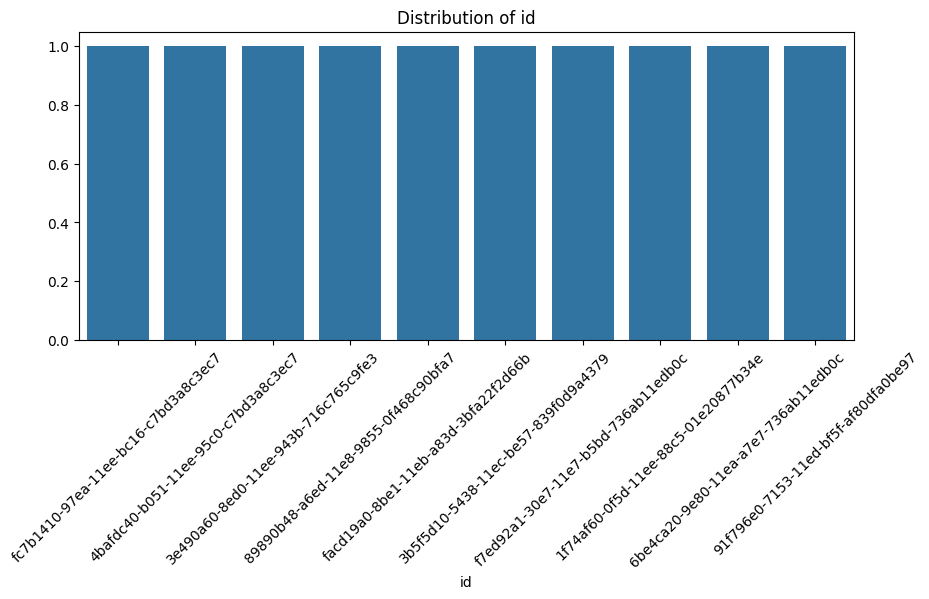


Top values in localityName:


localityName
г-Москва                                1615
г-Санкт-Петербург                       1188
Московская-область                       958
Новосибирская-область,-г-Новосибирск     419
Красноярский-край,-г-Красноярск          354
Башкортостан-республика,-г-Уфа           344
Свердловская-область,-г-Екатеринбург     341
Татарстан-республика,-г-Казань           338
Пермский-край,-г-Пермь                   333
Краснодарский-край,-г-Краснодар          332
Name: count, dtype: int64

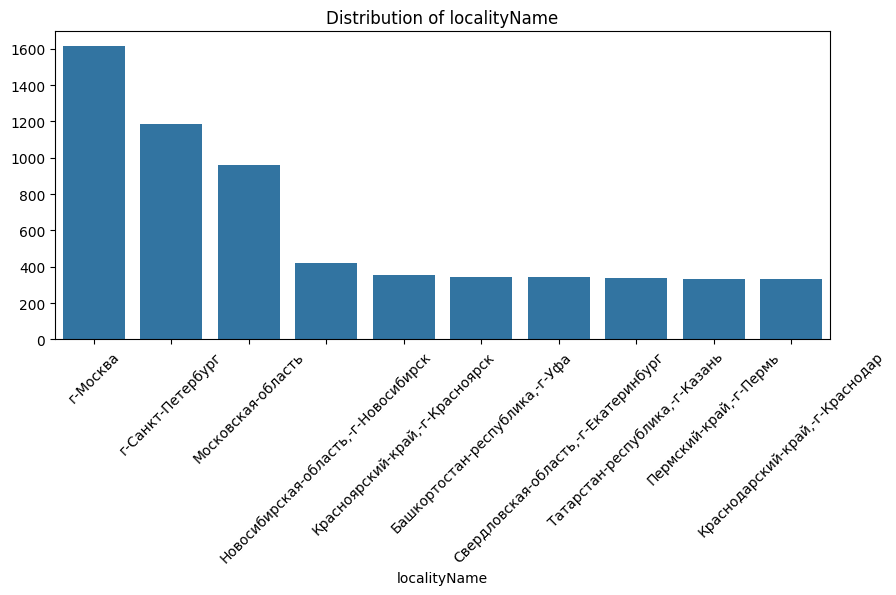


Top values in birthday:


birthday
1966-01-01T00:00:00+0300    11
1985-04-18T00:00:00+0400    11
1989-12-17T00:00:00+0300    10
1988-05-20T00:00:00+0400     9
1991-07-08T00:00:00+0300     9
1989-02-10T00:00:00+0300     8
1986-01-20T00:00:00+0300     8
1985-04-23T00:00:00+0400     8
1982-11-29T00:00:00+0300     8
1986-07-20T00:00:00+0400     8
Name: count, dtype: int64

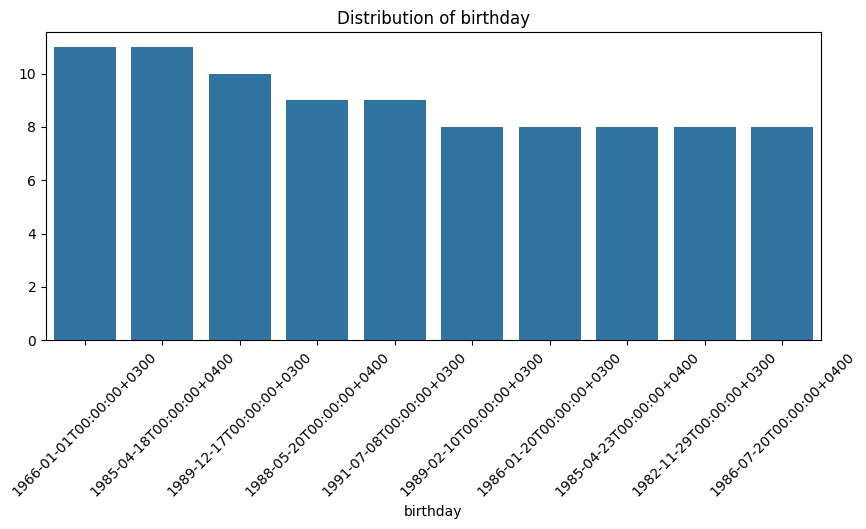


Top values in gender:


gender
Женский    22372
Мужской    16849
Name: count, dtype: int64

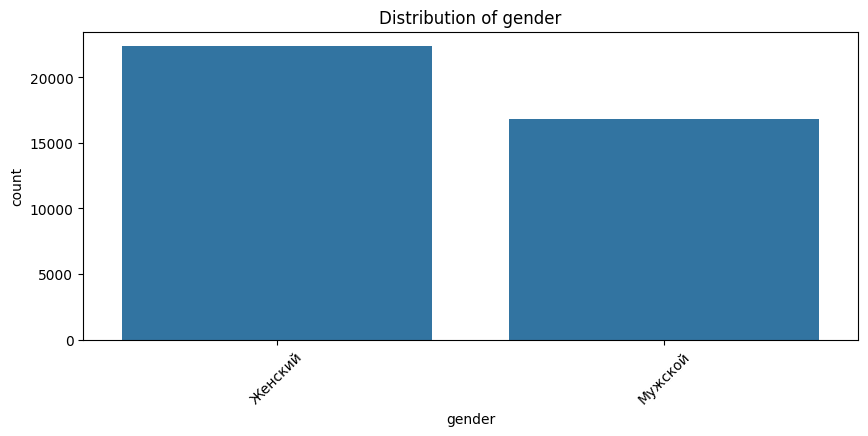


Top values in positionName:


positionName
Бухгалтер        858
Администратор    848
Менеджер         777
Специалист       755
Водитель         662
Продавец         606
Повар            384
Экономист        370
водитель         346
Юрист            325
Name: count, dtype: int64

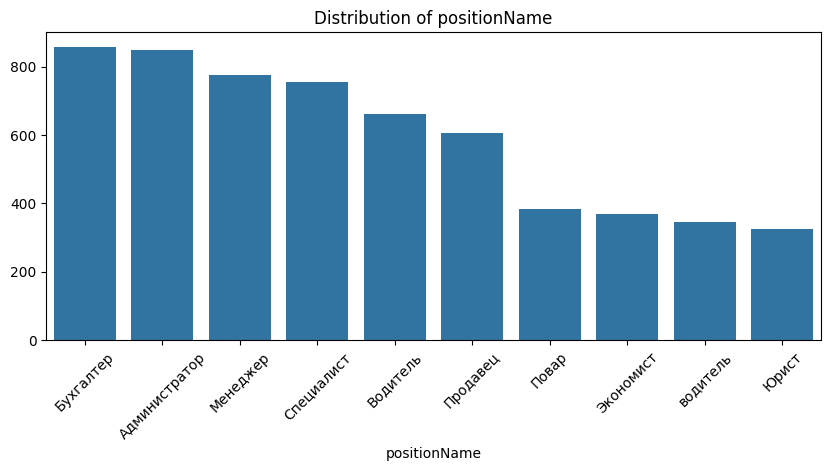


Top values in dateCreate:


dateCreate
2022-06-06T10:55:35+0300    2
2021-06-13T15:06:20+0300    2
2022-07-07T12:08:52+0300    2
2020-04-23T12:57:55+0300    2
2022-10-24T12:54:42+0300    2
2023-02-03T10:33:42+0300    2
2020-04-14T21:59:45+0300    2
2020-06-02T11:54:21+0300    2
2020-04-14T12:13:37+0300    2
2017-11-02T14:45:47+0300    2
Name: count, dtype: int64

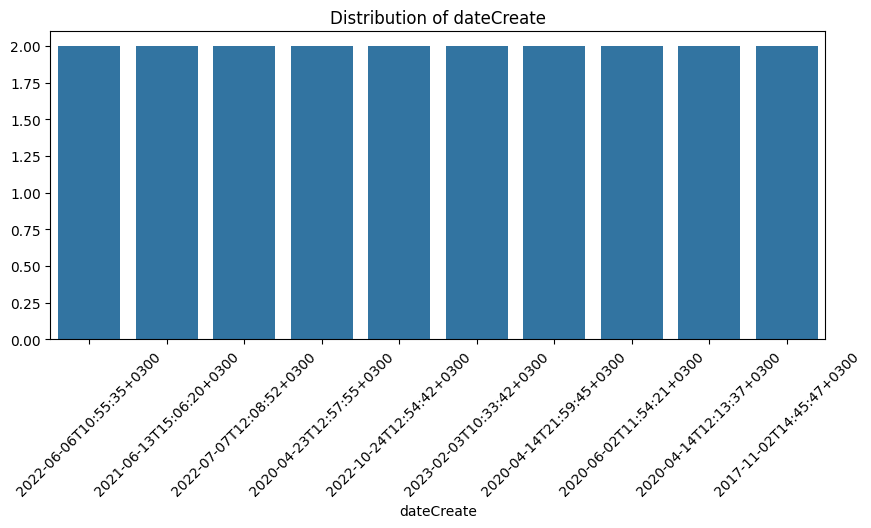


Top values in dateModify:


dateModify
2020-04-20T12:58:12+0300    2
2023-07-11T11:08:50+0300    2
2022-06-06T10:55:35+0300    2
2023-06-27T09:35:05+0300    2
2021-06-13T15:06:20+0300    2
2022-07-07T12:08:52+0300    2
2020-04-23T12:57:55+0300    2
2022-10-24T12:54:42+0300    2
2023-02-03T10:33:42+0300    2
2020-04-14T12:13:37+0300    2
Name: count, dtype: int64

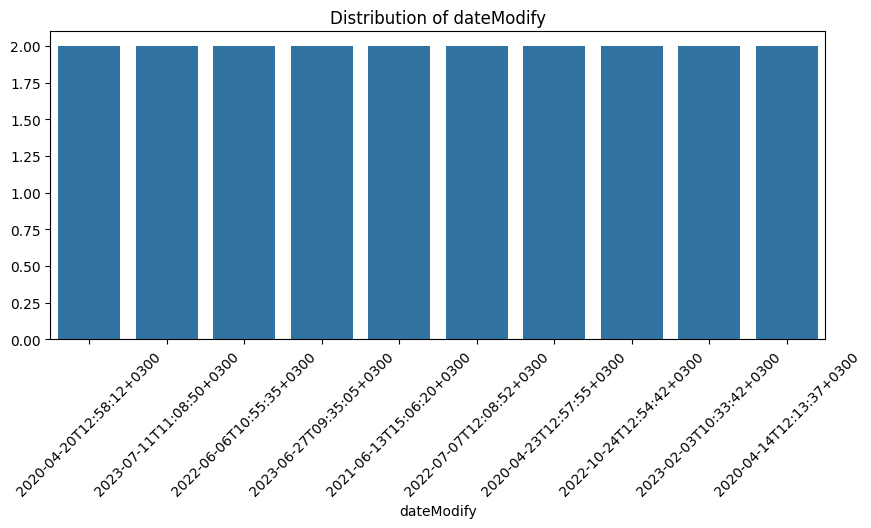


Top values in publishedDate:


publishedDate
2020-04-27T08:24:08+0300    2
2022-08-22T10:02:08+0300    2
2022-11-07T12:12:48+0300    2
2021-11-15T07:58:20+0300    2
2024-01-30T10:14:33+0300    2
2022-08-18T14:15:24+0300    2
2021-10-25T08:29:19+0300    2
2020-10-09T11:23:44+0300    2
2022-11-15T11:21:23+0300    2
2022-05-06T11:24:14+0300    2
Name: count, dtype: int64

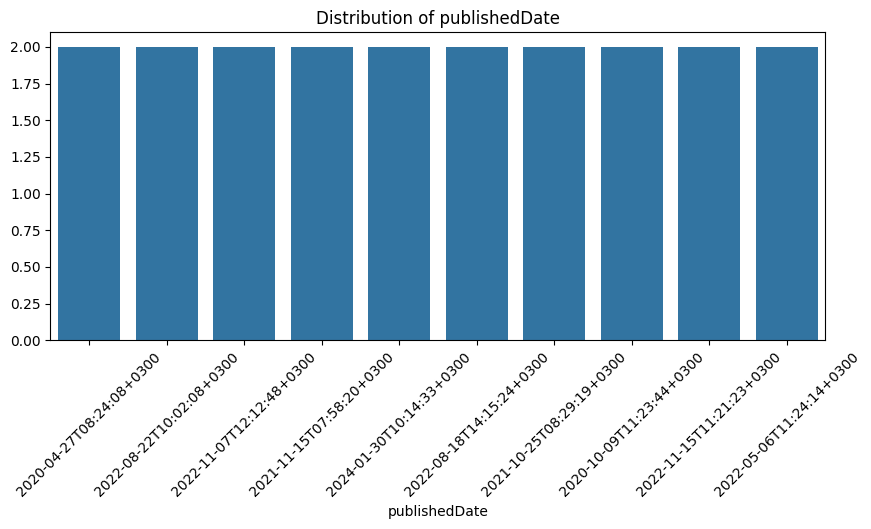


Top values in skills:


skills
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               


Top values in driveLicenses:


driveLicenses
[]                      29605
["B"]                    6960
["B", "C"]               1410
["A", "B", "C"]           357
["A", "B"]                305
["D", "B", "C"]           269
["A", "B", "C", "D"]      162
["C"]                      65
["A"]                      41
["D", "B"]                 14
Name: count, dtype: int64

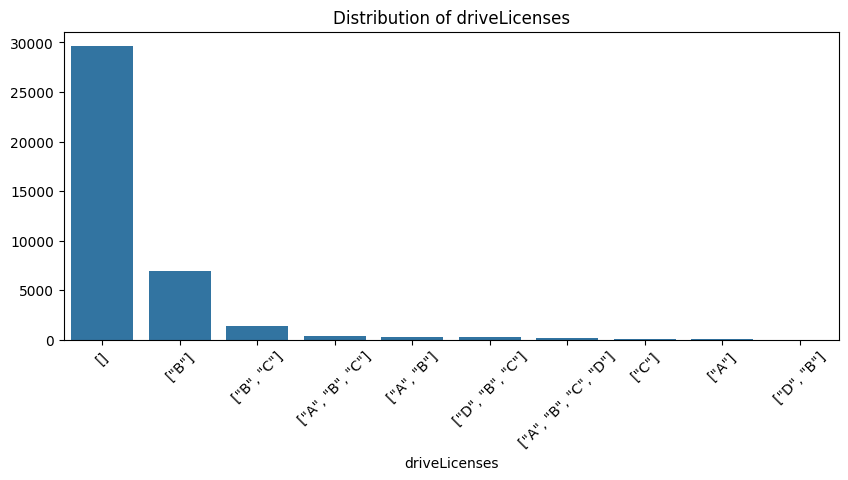


Top values in country:


country
[{'countryName': 'Российская Федерация', 'countryCode': 'RU'}]      39185
[{'countryName': 'Украина', 'countryCode': 'UA'}]                      15
[{'countryName': 'Республика Беларусь', 'countryCode': 'BY'}]           7
[{'countryName': 'Республика Казахстан', 'countryCode': 'KZ'}]          7
[{'countryName': 'Республика Молдова', 'countryCode': 'MD'}]            2
[{'countryName': 'Туркменистан', 'countryCode': 'TM'}]                  1
[{'countryName': 'Республика Армения', 'countryCode': 'AM'}]            1
[{'countryName': 'Республика Таджикистан', 'countryCode': 'TJ'}]        1
[{'countryName': 'Иное', 'countryCode': 'OT'}]                          1
[{'countryName': 'Республика Узбекистан', 'countryCode': 'UZ'}]         1
Name: count, dtype: int64

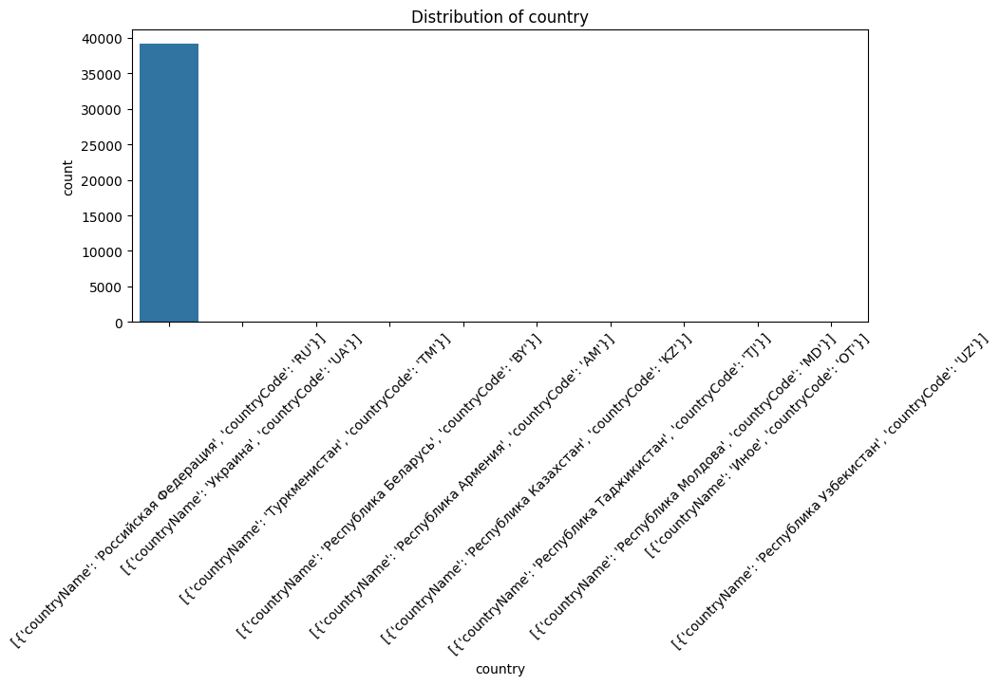


Top values in educationList:


educationList
[{'type': 'Education'}]                                                                                  3343
[]                                                                                                       1605
[{'speciality': 'Гуманитарные науки', 'type': 'Education'}]                                                40
[{'speciality': 'Биология', 'type': 'Education'}]                                                          35
[{'graduateYear': 2003, 'type': 'Education'}]                                                               9
[{'graduateYear': 2006, 'type': 'Education'}]                                                               8
[{'graduateYear': 2002, 'type': 'Education'}]                                                               8
[{'graduateYear': 2000, 'instituteName': 'школа', 'type': 'Education'}]                                     8
[{'graduateYear': 2004, 'type': 'Education'}]                                                             

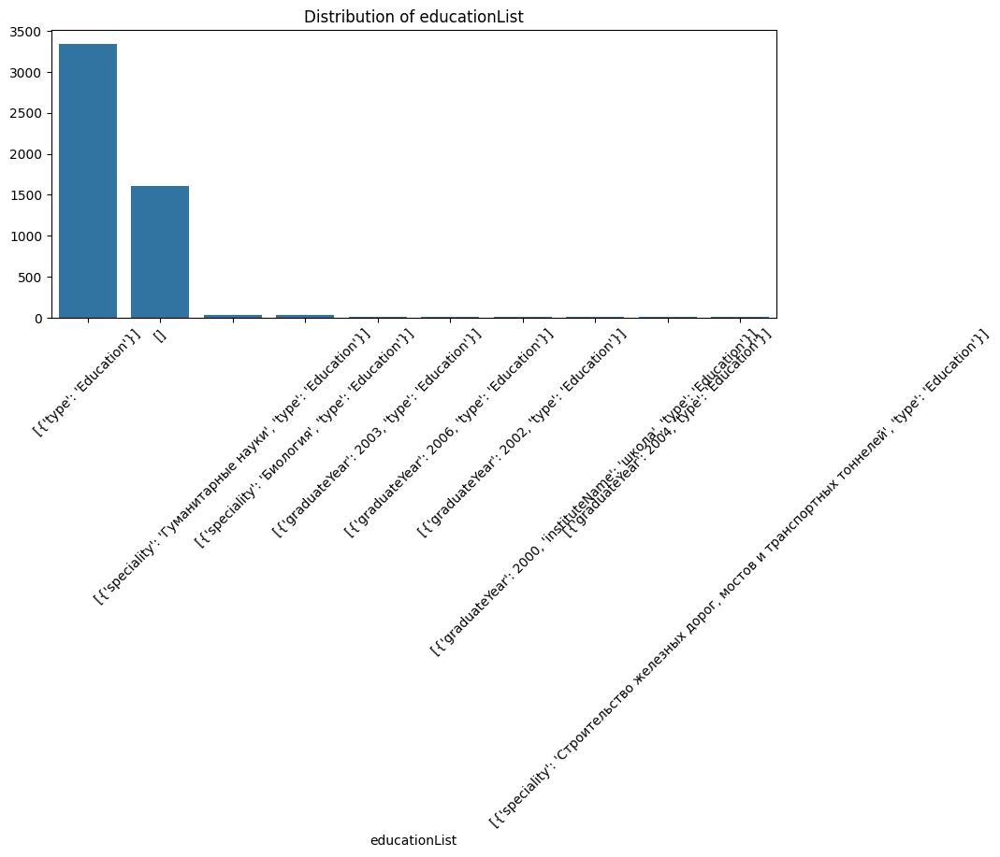


Top values in additionalEducationList:


additionalEducationList
[]                                                                                                                                  34441
[{"type": "Course"}]                                                                                                                   89
[{"organization": "-", "type": "Course"}]                                                                                              20
[{"organization": "нет", "type": "Course"}]                                                                                            16
[{"organization": "Нет", "type": "Course"}]                                                                                             8
[{"graduateYear": 2018, "organization": "ООО", "type": "Course"}]                                                                       4
[{"graduateYear": 2019, "organization": "ООО", "type": "Course"}]                                                                       4
[{"graduat

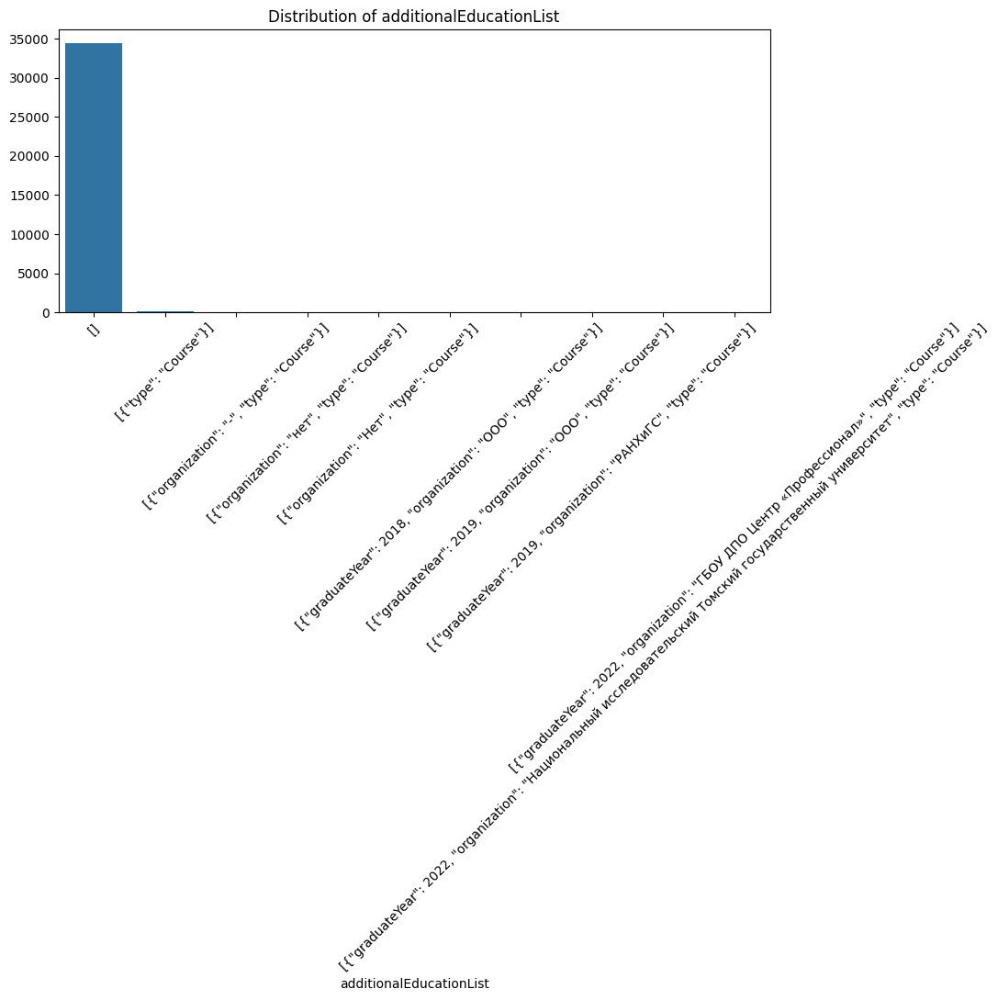


Top values in hardSkills:


hardSkills
[]                                                       33136
["умение работать в команде"]                              458
["ответственность за достижение результата"]               236
["стремление к профессиональному и карьерному росту"]       94
["коммуникабельность"]                                      94
["ответственный подход к работе"]                           83
["ответственность"]                                         79
["умение работать с документами"]                           58
["соблюдение трудовой дисциплины"]                          48
["обслуживание клиентов"]                                   47
Name: count, dtype: int64

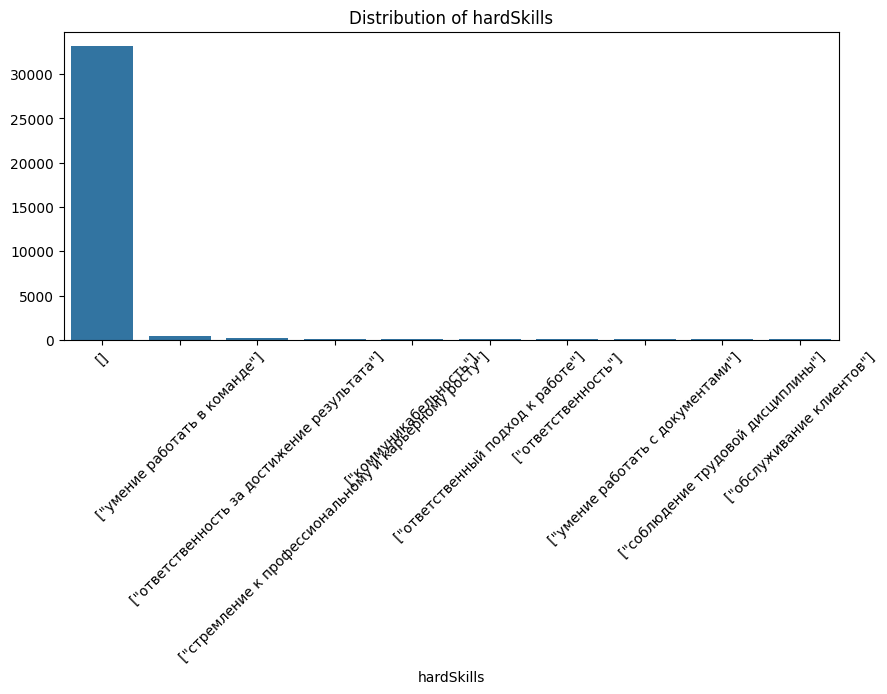


Top values in softSkills:


softSkills
[]                                            36535
["Работа в команде"]                            386
["Работоспособность"]                            95
["Умение находить общий язык с клиентами"]       83
["Внимательность к деталям"]                     81
["Организаторские навыки"]                       64
["Эффективное решение проблем"]                  54
["Умение расставлять приоритеты"]                54
["Умение планировать свою деятельность"]         49
["Нацеленность на результат"]                    42
Name: count, dtype: int64

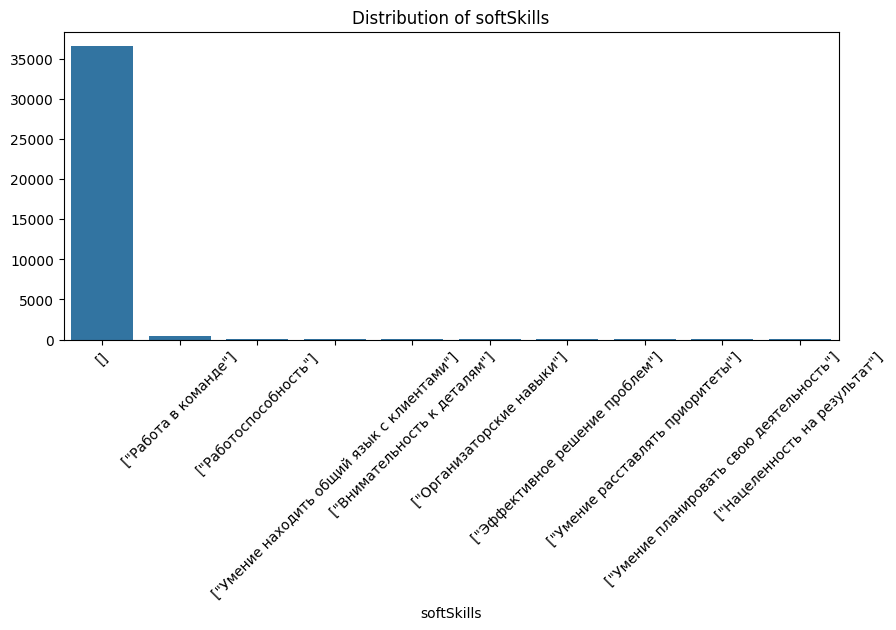


Top values in workExperienceList:


workExperienceList
[]                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

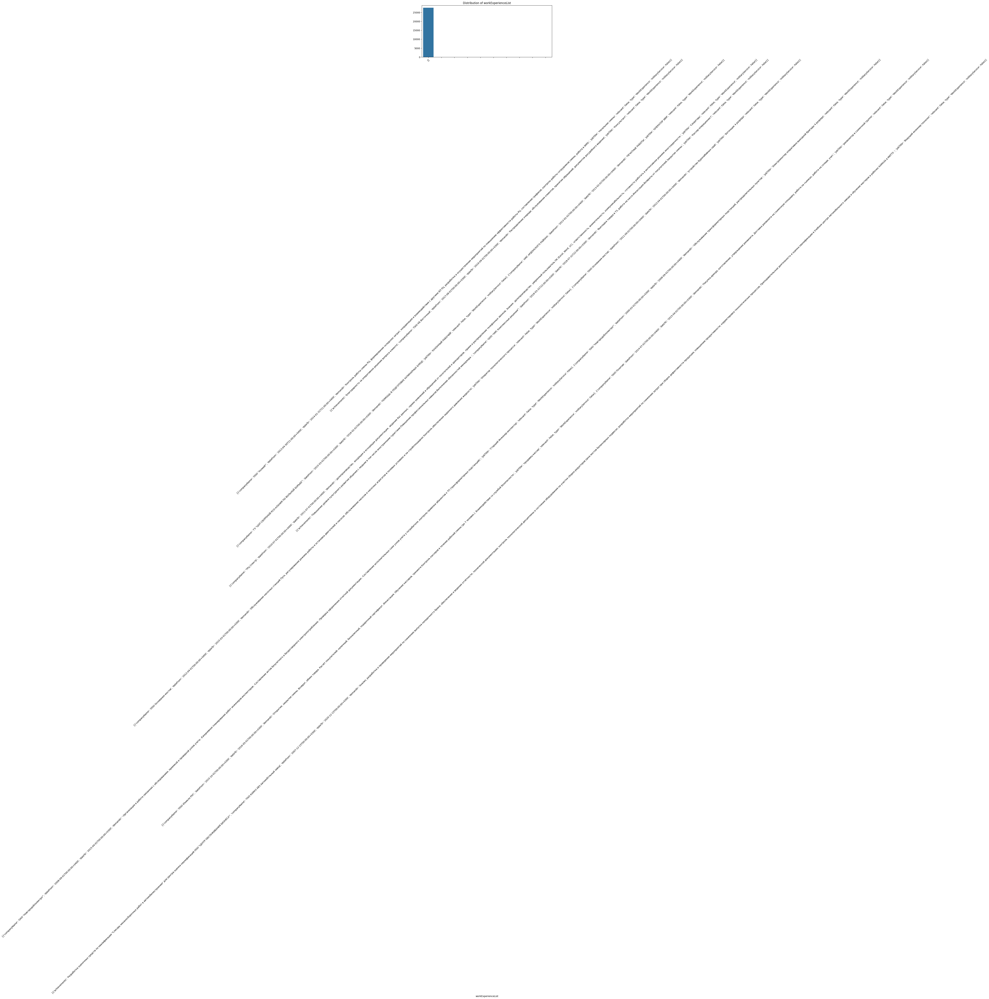


Top values in scheduleType:


scheduleType
Полный-рабочий-день    39221
Name: count, dtype: int64

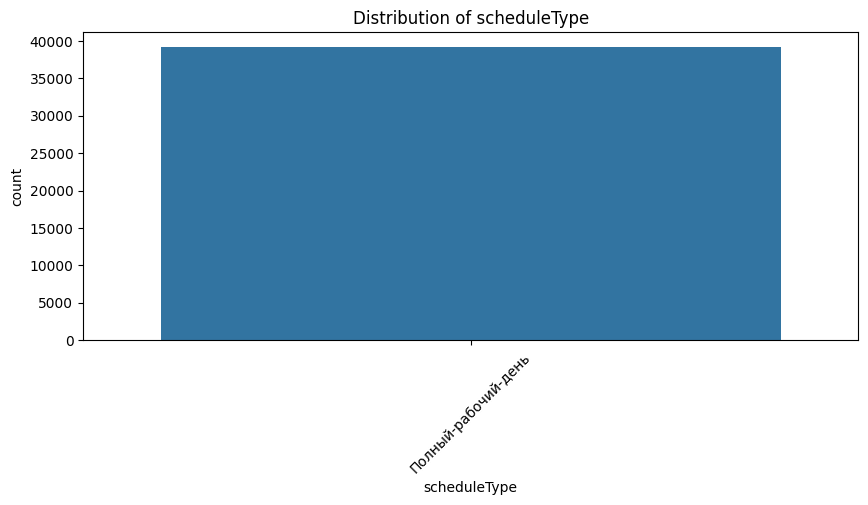


Top values in retrainingCapability:


retrainingCapability
Готов-к-переобучению       22561
Не-готов-к-переобучению    16660
Name: count, dtype: int64

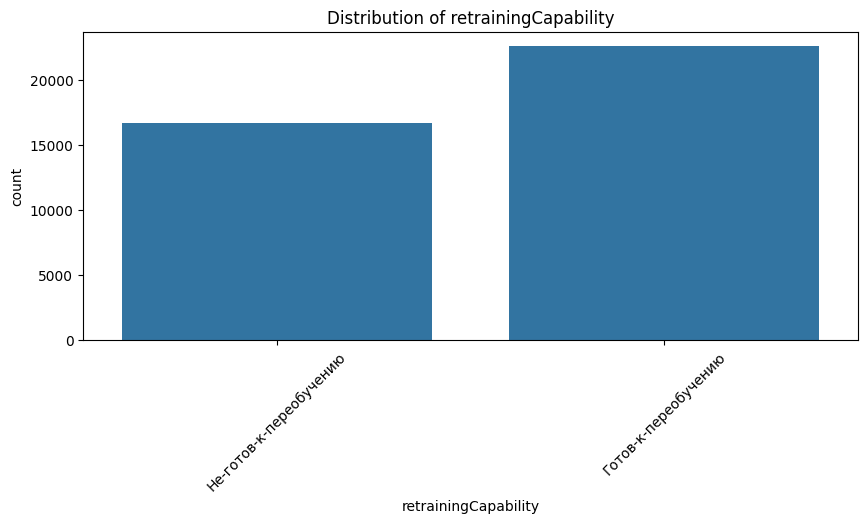


Top values in businessTrip:


businessTrip
Не-готов-к-командировкам    29256
Готов-к-командировкам        9965
Name: count, dtype: int64

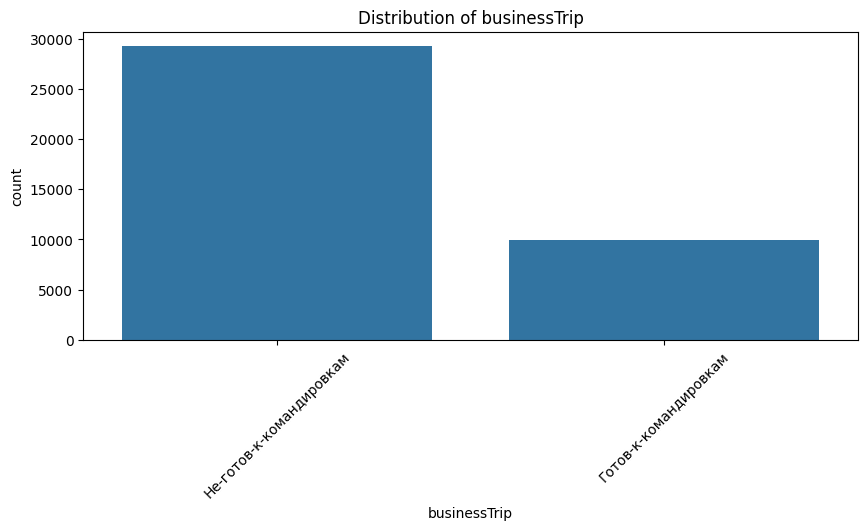


Top values in languageKnowledge:


languageKnowledge
[]                                                                                                                                                                                             17437
[{'codeLanguage': 'Русский', 'level': 'C2 — в совершенстве', 'type': 'LanguageKnowledge'}]                                                                                                      6861
[{'codeLanguage': 'Английский', 'level': 'A1 — начальный', 'type': 'LanguageKnowledge'}]                                                                                                        3881
[{'codeLanguage': 'Русский', 'level': 'A1 — начальный', 'type': 'LanguageKnowledge'}]                                                                                                           3134
[{'codeLanguage': 'Английский', 'level': 'B2 — средне-продвинутый', 'type': 'LanguageKnowledge'}]                                                                                               23

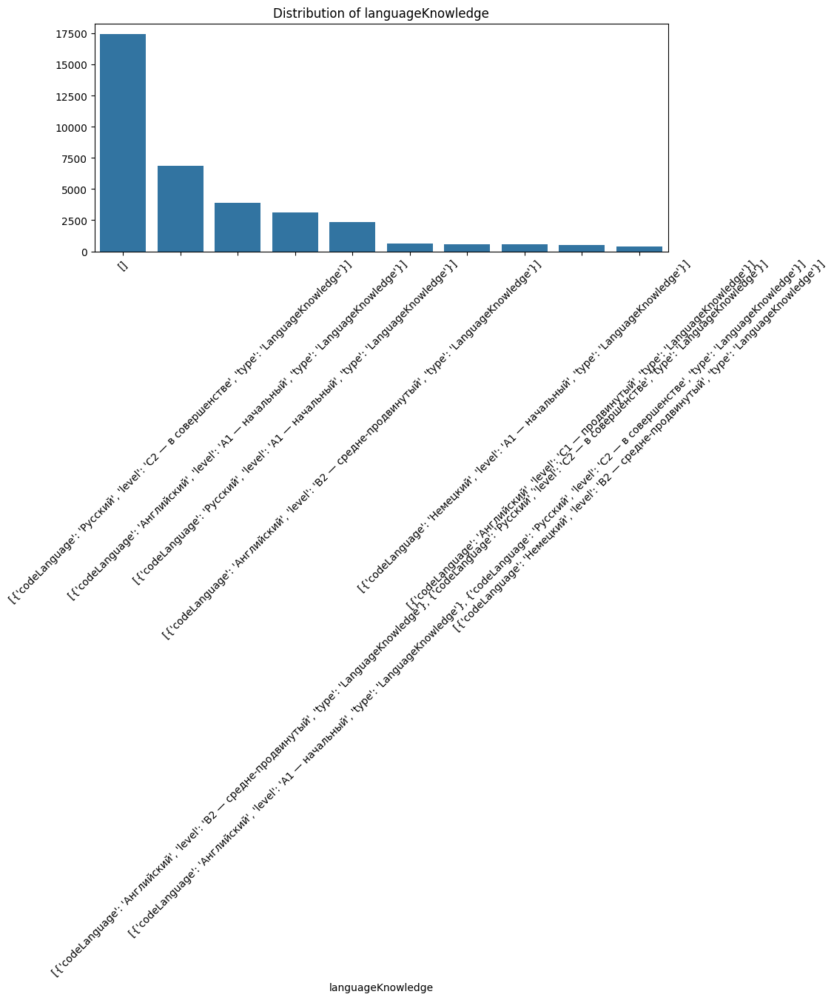


Top values in relocation:


relocation
Не-готов-к-переезду    36976
Готов-к-переезду        2245
Name: count, dtype: int64

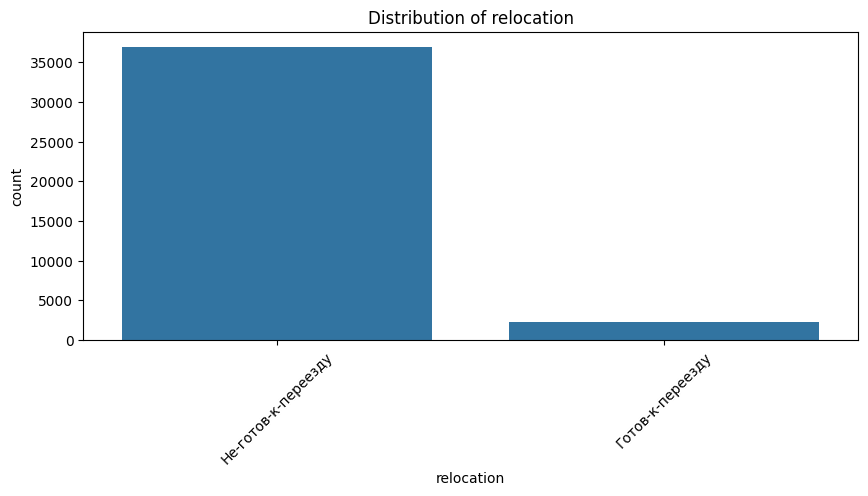


Top values in innerInfo:


innerInfo
{"idUser": "73d53a30-7d24-11ea-9a6b-dbfd80b8ec0d", "rfCitizen": "Соискатель является гражданином РФ", "visibility": "Видно всем", "deleted": false, "dateModify": "2021-06-13T15:06:20+0300"}    2
{"idUser": "423fea00-cde2-11eb-ab8d-dbfd80b8ec0d", "rfCitizen": "Соискатель является гражданином РФ", "visibility": "Видно всем", "deleted": false, "dateModify": "2021-06-16T19:51:54+0300"}    2
{"idUser": "5c4580d0-136d-11e5-8a60-1ff705945672", "rfCitizen": "Соискатель является гражданином РФ", "visibility": "Видно всем", "deleted": false, "dateModify": "2023-12-11T09:03:20+0300"}    1
{"idUser": "bc610280-8f3e-11ea-abb6-c3d833d6401c", "rfCitizen": "Соискатель является гражданином РФ", "visibility": "Видно всем", "deleted": false, "dateModify": "2022-10-03T05:28:28+0300"}    1
{"idUser": "b29c10e0-404d-11e5-96ff-1ff705945672", "rfCitizen": "Соискатель является гражданином РФ", "visibility": "Видно всем", "deleted": false, "dateModify": "2015-10-17T11:27:50+0300"}    1
{"idUser": "ef0

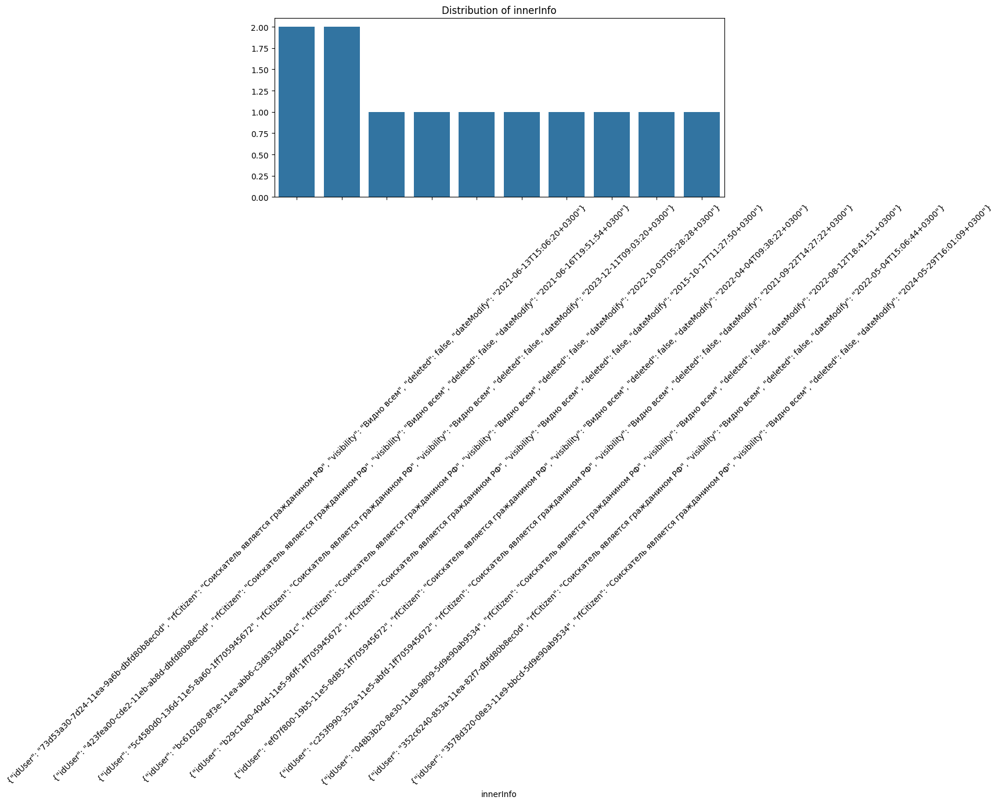


Top values in education:


education
Высшее-бакалавриат                              14188
Среднее-общее                                   12472
Среднее                                          6655
Среднее-профессиональное                          301
Нет-основного-общего                              198
Основное-общее                                    166
Высшее-специалитет,-магистратура                  147
Высшее-подготовка-кадров-высшей-квалификации       86
Высшее                                             31
Незаконченное-высшее                                1
Name: count, dtype: int64

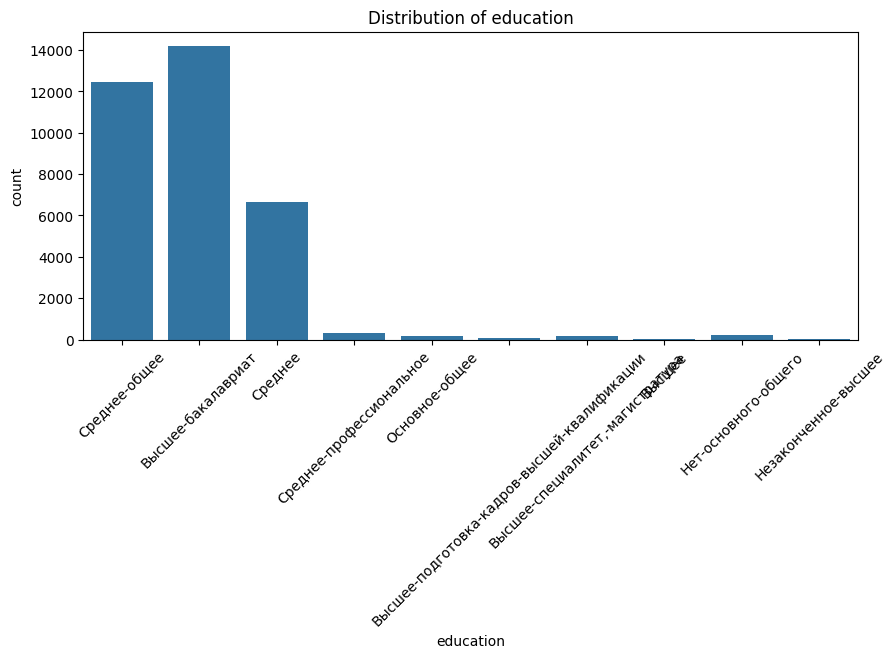


Top values in region:


region
Москва             1773
Московская-        1617
Краснодарский-     1503
Санкт-петербург    1379
Свердловская-      1253
Башкортостан-      1152
Пермский-          1111
Челябинская-       1084
Красноярский-      1058
Ростовская-         992
Name: count, dtype: int64

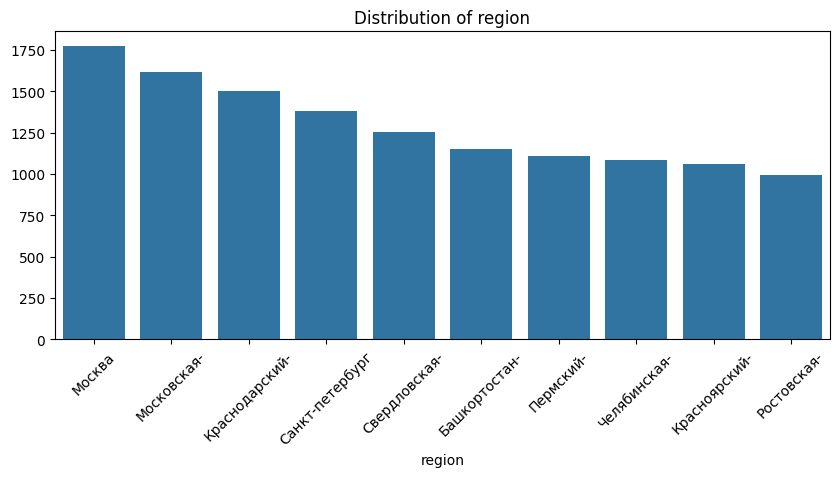


Top values in position_1_title:


position_1_title
Бухгалтер               215
Администратор           131
Продавец                117
Менеджер по продажам    109
Продавец-консультант     88
Менеджер                 87
бухгалтер                85
Водитель                 81
Продавец-кассир          74
водитель                 66
Name: count, dtype: int64

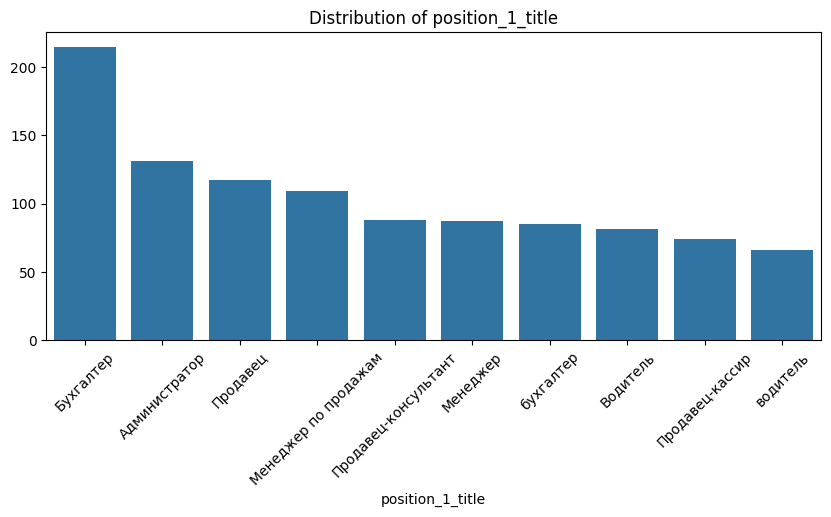


Top values in position_1_company:


position_1_company
ПАО Сбербанк           33
ООО                    19
АО Тандер              19
Почта России           18
Сбербанк               14
ПАО Сбербанк России    13
ООО "Агроторг"         12
Ростелеком             11
ОАО РЖД                10
ОАО "РЖД"              10
Name: count, dtype: int64

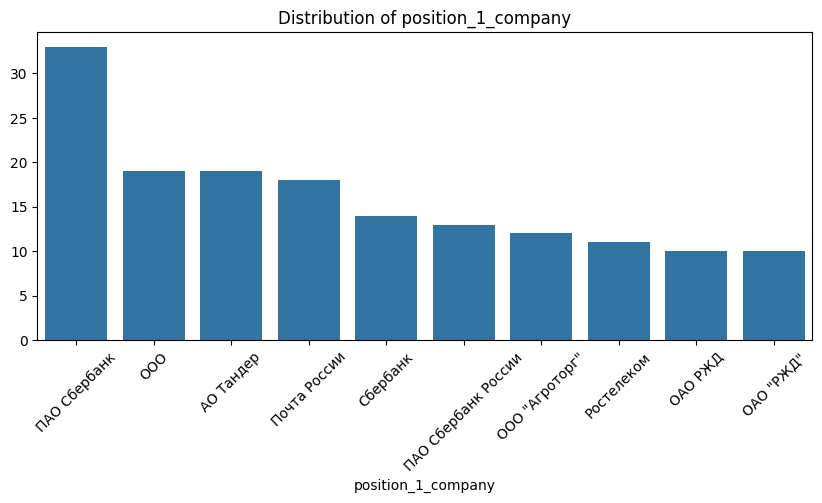


Top values in position_2_title:


position_2_title
Бухгалтер               154
Продавец                 79
Администратор            74
Продавец-консультант     72
Менеджер по продажам     71
бухгалтер                70
Продавец-кассир          56
Менеджер                 54
Водитель                 53
Главный бухгалтер        46
Name: count, dtype: int64

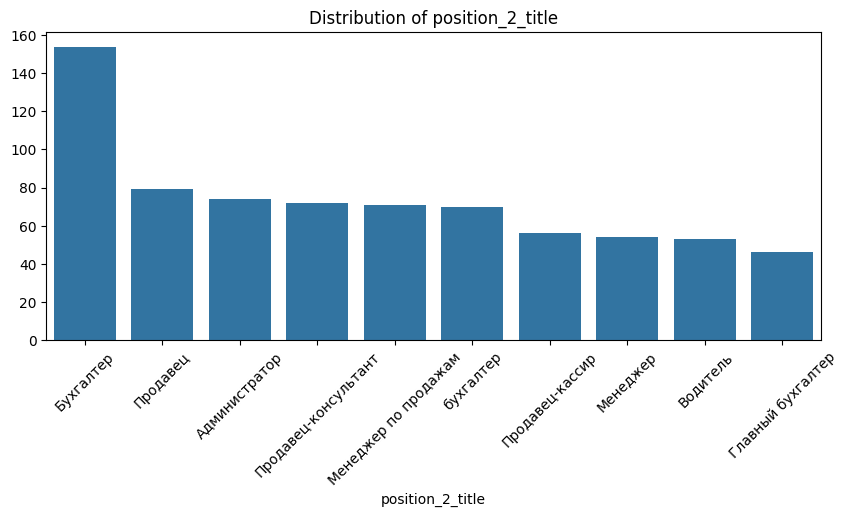


Top values in position_2_company:


position_2_company
ПАО Сбербанк                      22
ООО                               19
Индивидуальный предприниматель    11
Почта России                      10
АО Тандер                          9
АО "Тандер"                        9
Сбербанк                           8
ПАО Сбербанк России                8
ОАО РЖД                            7
Ростелеком                         7
Name: count, dtype: int64

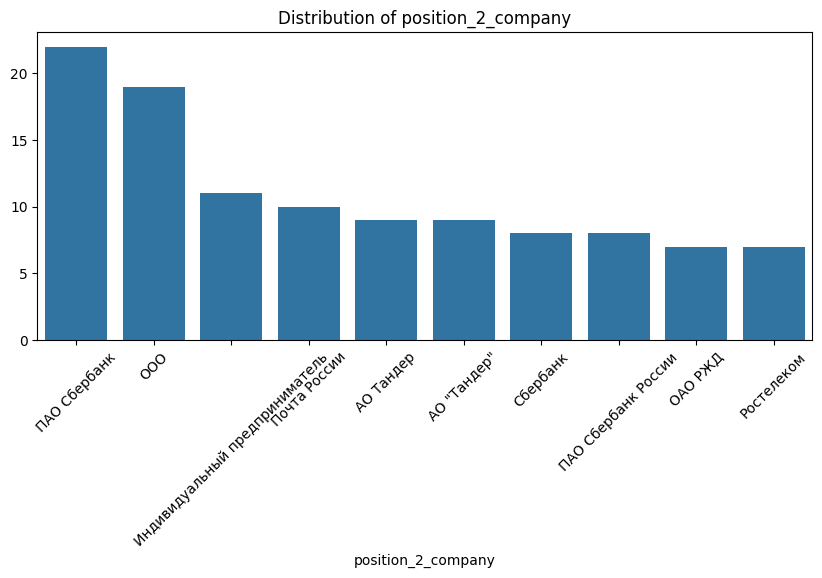


Top values in position_3_title:


position_3_title
Бухгалтер               104
бухгалтер                47
Менеджер по продажам     44
Продавец-консультант     43
Директор                 38
Продавец                 38
Главный бухгалтер        36
Администратор            33
Продавец-кассир          31
Юрисконсульт             24
Name: count, dtype: int64

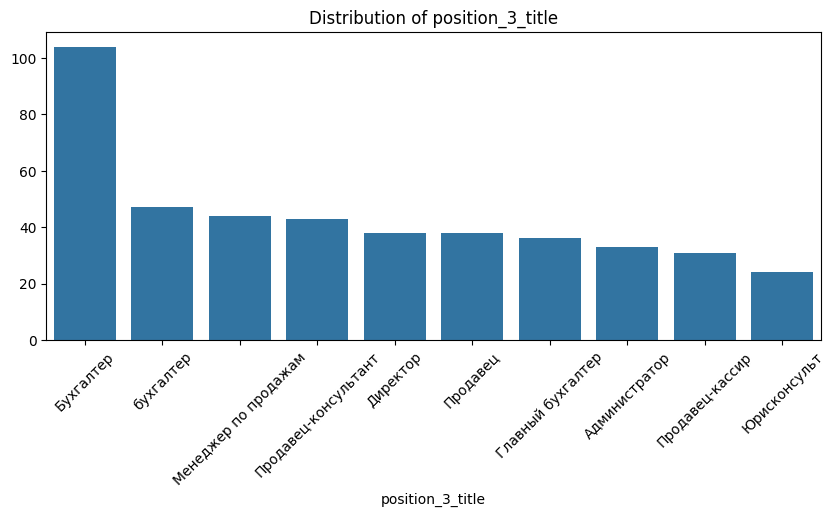


Top values in position_3_company:


position_3_company
ПАО Сбербанк           11
ООО                     9
Почта России            6
Ростелеком              4
ПАО Сбербанк России     4
ОАО Сбербанк России     3
Сбербанк России         3
Связной                 3
ОАО РЖД                 3
ВС РФ                   3
Name: count, dtype: int64

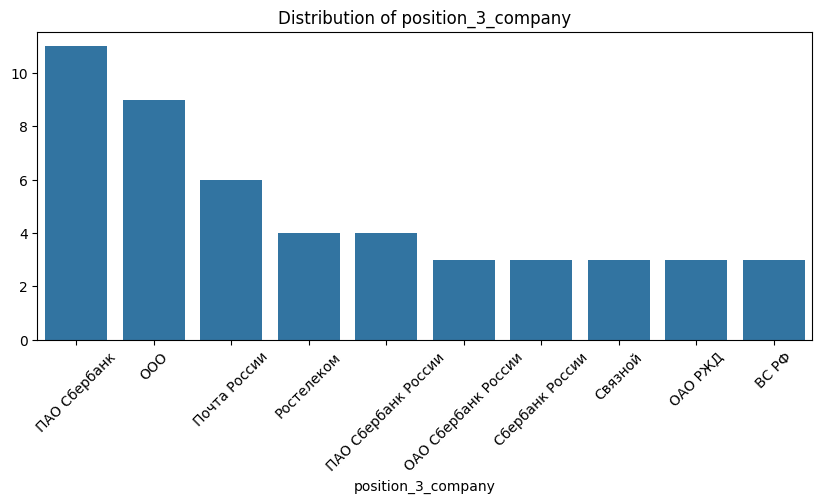


Top values in position_4_title:


position_4_title
Бухгалтер               59
бухгалтер               34
Продавец-консультант    27
Менеджер по продажам    25
Администратор           24
Продавец                23
Главный бухгалтер       22
Менеджер                21
менеджер                18
Продавец-кассир         18
Name: count, dtype: int64

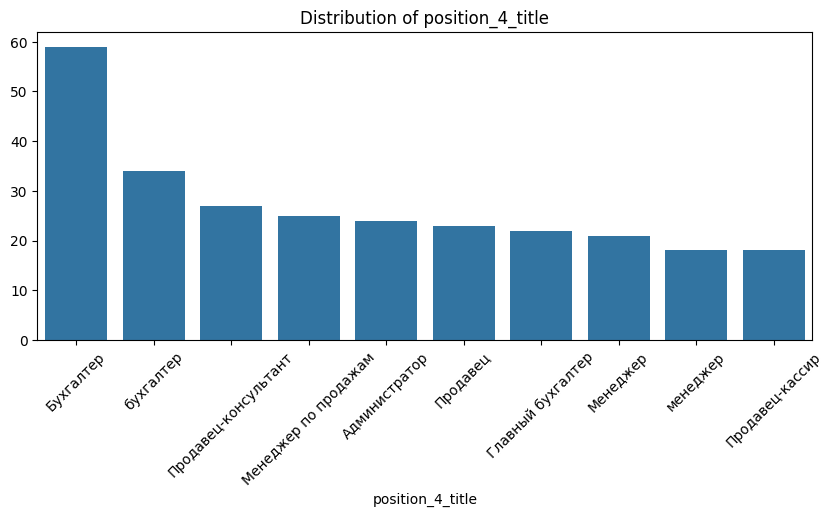


Top values in position_4_company:


position_4_company
ПАО Сбербанк                                     10
ООО                                               4
Федеральная служба государственной статистики     3
ОАО РЖД                                           3
Почта России                                      3
ИП                                                3
ООО "Позитив"                                     2
Федеральная налоговая служба                      2
ЗАО "Тандер"                                      2
ОАО "Сбербанк России"                             2
Name: count, dtype: int64

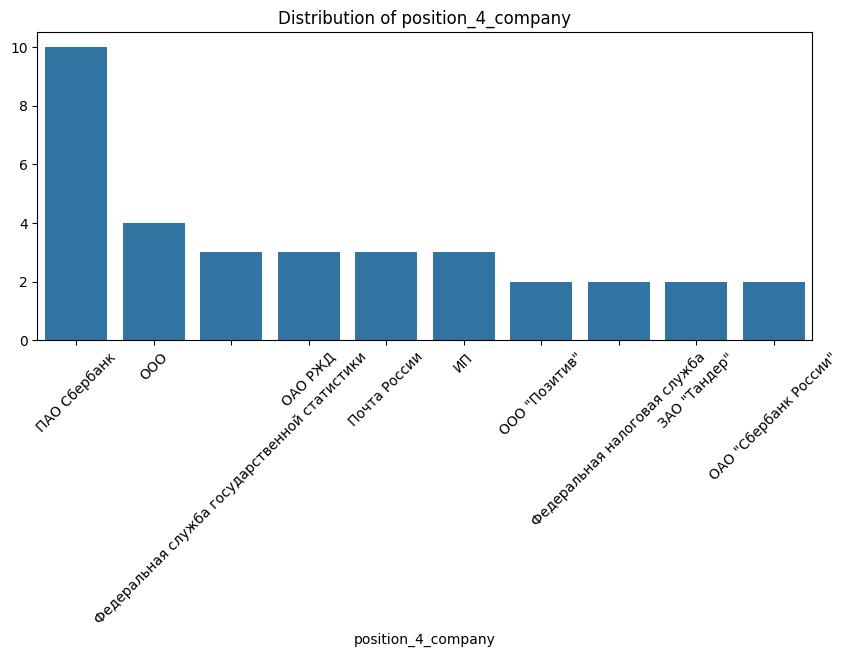


Top values in position_5_title:


position_5_title
Бухгалтер               31
бухгалтер               21
Главный бухгалтер       17
Продавец-консультант    16
Продавец-кассир         16
Водитель                13
Продавец                13
Менеджер по продажам    12
Администратор           11
Юрисконсульт            10
Name: count, dtype: int64

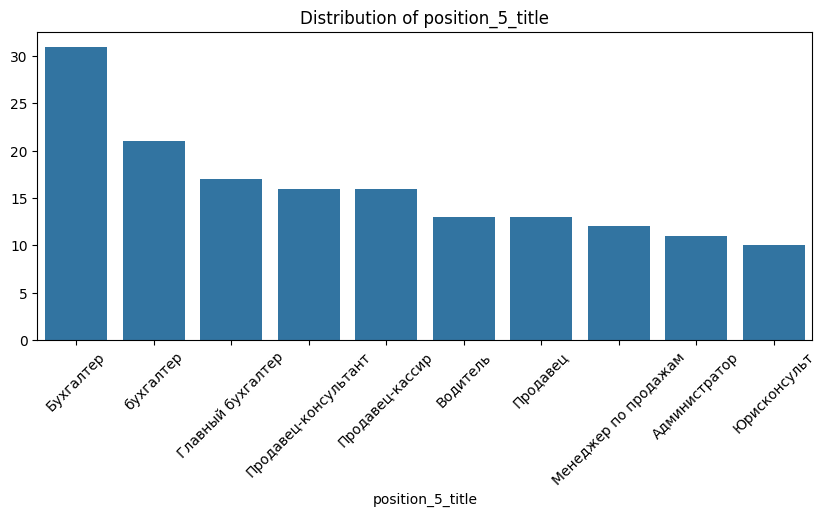


Top values in position_5_company:


position_5_company
ПАО Сбербанк                                                   4
ОАО РЖД                                                        3
ООО                                                            2
РЖД                                                            2
Колхоз имени Ленина Богучарского района Воронежской области    2
МВД РФ                                                         2
Вымпелком                                                      2
ПАО Сбербанк России                                            2
ФГУП "Почта России"                                            2
ОАО "ЮТК"                                                      2
Name: count, dtype: int64

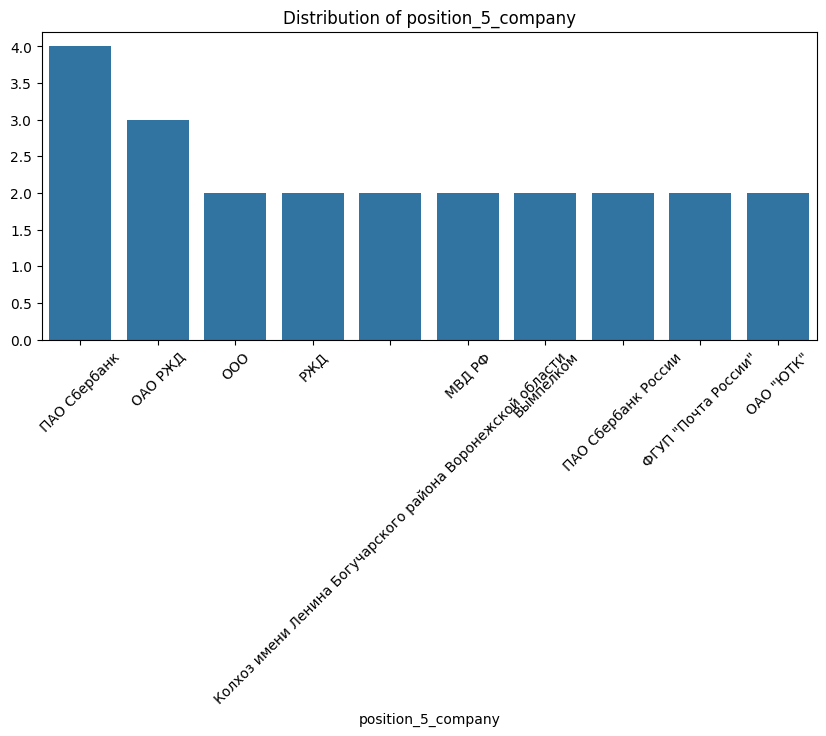


Top values in positionCategory:


positionCategory
Производство и рабочие                7433
Транспорт и логистика                 4803
Менеджмент и управление               4667
Инженеры и технические специалисты    4409
Административный персонал             3653
Бухгалтерия и финансы                 3423
Продажи и маркетинг                   3399
Образование и воспитание              1803
Юриспруденция                         1726
Безопасность                          1620
Name: count, dtype: int64

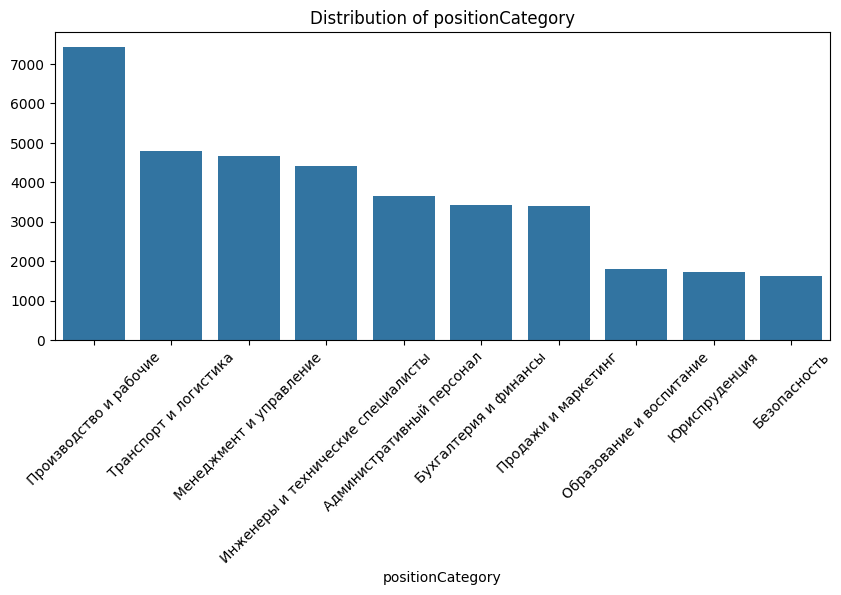

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from datetime import datetime

def generate_simple_report(df):
    """Generate a simplified EDA report that handles list-type columns"""




    print("═"*80)
    print(f" SIMPLE DATA ANALYSIS REPORT".center(80))
    print(f" Generated on: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}".center(80))
    print(f" Total Records: {len(df):,} | Variables: {len(df.columns)}".center(80))
    print("═"*80 + "\n")

    
    print("\n" + " BASIC INFO ".center(80, "─"))
    display(df.head(3))

   
    print("\n" + " DATA TYPES ".center(80, "─"))
    display(pd.DataFrame(df.dtypes.value_counts()).style.background_gradient(cmap='Blues'))

   
    print("\n" + " MISSING VALUES ".center(80, "─"))
    missing = df.isna().sum()
    if missing.sum() > 0:
        display(pd.DataFrame(missing[missing > 0], columns=['Missing Count']))
    else:
        print(" No missing values")

   
    print("\n" + " NUMERICAL ANALYSIS ".center(80, "─"))
    num_cols = df.select_dtypes(include=['number']).columns
    if len(num_cols) > 0:
        display(df[num_cols].describe().style.background_gradient(cmap='YlOrBr'))

   
        for col in num_cols:
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 2, 1)
            sns.histplot(df[col], kde=True)
            plt.title(f'Distribution of {col}')

            plt.subplot(1, 2, 2)
            sns.boxplot(x=df[col])
            plt.title(f'Boxplot of {col}')

            plt.tight_layout()
            plt.show()

    
print("\n" + " CATEGORICAL ANALYSIS ".center(80, "─"))
cat_cols = df.select_dtypes(include=['object']).columns
if len(cat_cols) > 0:
    for col in cat_cols:
      
        col_data = df[col].apply(lambda x: str(x) if isinstance(x, list) else x)

        print(f"\nTop values in {col}:")
        display(col_data.value_counts().head(10))

        plt.figure(figsize=(10, 4))
        if col_data.nunique() > 10:
            
            top_values = col_data.value_counts().head(10)
            sns.barplot(x=top_values.index, y=top_values.values)
            plt.xticks(rotation=45)
        else:
            sns.countplot(data=pd.DataFrame({col: col_data}), x=col)
            plt.xticks(rotation=45)
        plt.title(f'Distribution of {col}')
        plt.show()



In [16]:
df['years_since_graduation'].head(10)


0    41.0
1     9.0
2    11.0
3    34.0
4    18.0
5    21.0
6    31.0
7    13.0
8    12.0
9     1.0
Name: years_since_graduation, dtype: float64

In [ ]:
import pandas as pd
import json
import numpy as np

def add_last_job_ended_flag(df, work_exp_column='workExperienceList'):
    """
    Adds a binary column indicating whether the person's most recent job has ended.

    Parameters:
    df (pd.DataFrame): Input DataFrame containing work experience data
    work_exp_column (str): Name of the column containing work experience records

    Returns:
    pd.DataFrame: Original DataFrame with added 'last_job_ended' column where:
        - 1 = most recent job has ended (has dateTo)
        - 0 = still employed at most recent job (no dateTo)
        - None = invalid/missing data
    """

    def parse_single_record(record):
        """Handles parsing of individual work experience records"""
        if record is None or record is np.nan or record == '':
            return None
        if isinstance(record, str):
            try:
                return json.loads(record)
            except (json.JSONDecodeError, ValueError):
                return None
        return record

    def determine_employment_status(parsed_exp):
        """Determines if last job has ended"""
        if not parsed_exp or not isinstance(parsed_exp, list):
            return None

        try:
           
            valid_jobs = []
            for job in parsed_exp:
                if not isinstance(job, dict):
                    continue
                if 'dateFrom' not in job:
                    continue
                try:
                    pd.to_datetime(job['dateFrom'])
                    valid_jobs.append(job)
                except (ValueError, TypeError):
                    continue

            if not valid_jobs:
                return None

          
            last_job = max(valid_jobs,
                          key=lambda x: pd.to_datetime(x['dateFrom']))

            return 1 if 'dateTo' in last_job else 0

        except Exception:
            return None

    
    df['last_job_ended'] = (
        df[work_exp_column]
        .apply(parse_single_record)
        .apply(determine_employment_status)
    )

    return df

In [18]:
df = add_last_job_ended_flag(df)

In [19]:


# 2. Save to CSV
#output_path = '/content/lyprocessed_cv_data.csv'
#df.to_csv(output_path, index=False, encoding='utf-8-sig')

# 3. Download
#from google.colab import files
#files.download(output_path)



In [20]:
pip install lifelines matplotlib pandas

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:

bins = [0, 25, 35, 45, 55, 65, 100]
labels = ['<25', '25–34', '35–44', '45–54', '55–64', '65+']


df['age_group'] = pd.cut(df['age'], bins=bins, labels=labels, right=False)


print(df[['age', 'age_group']].head())


    age age_group
0  58.0     55–64
1  35.0     35–44
2  29.0     25–34
3  51.0     45–54
4  45.0     45–54


In [ ]:

bins = [0, 30000, 50000, 70000, 100000, 200000, 400000, float('inf')]
labels = ['<30K', '30K–50K', '50K–70K', '70K–100K', '100K-200k', '200-400k', '400+']


df['salary_category'] = pd.cut(df['salary'], bins=bins, labels=labels, right=False)


print(df[['salary', 'salary_category']].head())


     salary salary_category
0   25000.0            <30K
1  150000.0       100K-200k
2   40000.0         30K–50K
3   27000.0            <30K
4   60000.0         50K–70K


In [ ]:
import pandas as pd


bins = [0, 1, 3, 5, 10, 20, 30, float('inf')]
labels = ['<1 year', '1-3 years', '3-5 years', '5-10 years', '10-20 years', '20-30 years', '30+']


df['experience_group'] = pd.cut(df['experience'], bins=bins, labels=labels, right=False)


In [ ]:
import pandas as pd


bins = [0, 6, 12, 24, 60,96,144, float('inf')]
labels = ['<6 months', '6–12 months', '1–2 years', '2–5 years', '5-8 years', '8-12', '12+']


df['job_duration_group'] = pd.cut(df['avg_job_duration_months'], bins=bins, labels=labels, right=False)

print(df[['avg_job_duration_months', 'job_duration_group']].head())


   avg_job_duration_months job_duration_group
0                      NaN                NaN
1                 7.698204        6–12 months
2               132.424442               8-12
3                      NaN                NaN
4                40.013141          2–5 years


In [25]:
def categorize_job_change(freq):
    if pd.isna(freq):
        return 'Unknown'
    elif freq <= 0.24:
        return 'Rarely (≤1 job change every 4+ years)'
    elif freq <= 0.46:
        return 'Infrequent (~1 job change every 2–4 years)'
    elif freq <= 0.93:
        return 'Occasional (~1 job change every 1–2 years)'
    else:
        return 'Frequent (≥1 job change per year)'

df['job_change_category'] = df['job_change_frequency'].apply(categorize_job_change)


In [26]:
def categorize_num_jobs(n):
    if pd.isna(n):
        return 'Unknown'
    elif n == 1:
        return 'Single-job holder'
    elif n == 2:
        return 'Low job mobility (2 jobs)'
    elif 3 <= n <= 4:
        return 'Moderate job mobility (3–4 jobs)'
    elif 5 <= n <= 9:
        return 'High job mobility (5–9 jobs)'
    else:
        return 'Very high mobility (10+ jobs)'

df['num_jobs_category'] = df['num_jobs'].apply(categorize_num_jobs)


In [27]:
def categorize_tenure(months):
    if pd.isna(months):
        return 'Unknown'
    elif months == 0:
        return 'No tenure (0 months)'
    elif months <= 6:
        return 'Very short-term (< 6 months)'
    elif months <= 18:
        return 'Short-term (6–18 months)'
    elif months <= 48:
        return 'Mid-term (1.5–4 years)'
    else:
        return 'Long-term (> 4 years)'

df['last_job_tenure_category'] = df['months_worked_last_job'].apply(categorize_tenure)


In [ ]:
def categorize_position(position):
    position = str(position).lower()

    if any(k in position for k in ['разработчик', 'developer', 'программист', 'frontend', 'backend', 'web', 'html', 'css', 'react', 'php', 'java', 'python']):
        return 'IT/Developer'
    if 'qa' in position or 'тестировщик' in position:
        return 'QA/Testing'
    if any(k in position for k in ['hr', 'кадрам', 'кадровик', 'рекрутер', 'персонал']):
        return 'HR'
    if any(k in position for k in ['администратор', 'делопроизводитель', 'секретарь', 'офис', 'диспетчер']):
        return 'Administrative'
    if any(k in position for k in ['маркетолог', 'smm', 'таргетолог', 'реклама', 'бренд', 'pr']):
        return 'Marketing/PR'
    if any(k in position for k in ['продаж', 'менеджер по продажам', 'продавец', 'торговый']):
        return 'Sales'
    if any(k in position for k in ['дизайнер', 'ux', 'ui', 'художник']):
        return 'Design'
    if any(k in position for k in ['бухгалтер', 'финанс', 'экономист', 'аудитор', 'аналитик']):
        return 'Finance/Accounting'
    if any(k in position for k in ['юрист', 'юрисконсульт', 'таможн']):
        return 'Legal'
    if any(k in position for k in ['поддержка', 'клиентами', 'помощник', 'сопровождение', 'ассистент']):
        return 'Customer Service'
    if any(k in position for k in ['логист', 'склад', 'кладовщик', 'курьер', 'доставк', 'грузчик', 'комплектовщик']):
        return 'Logistics/Warehouse'
    if any(k in position for k in ['преподаватель', 'учитель', 'репетитор', 'воспитатель', 'научный', 'педагог', 'библиотек']):
        return 'Education/Science'
    if any(k in position for k in ['директор', 'руководитель', 'начальник', 'управляющий', 'заместитель', 'организатор']):
        return 'Top Management'
    if any(k in position for k in ['врач', 'медсестра', 'медицинский', 'психолог', 'стоматолог', 'санитар']):
        return 'Medical'
    if any(k in position for k in ['инженер', 'машинист', 'сервисный инженер', 'конструктор', 'электромонтер', 'технолог', 'нормировщик']):
        return 'Engineering'
    if any(k in position for k in ['слесарь', 'маляр', 'станочник', 'электрик', 'токарь', 'рабочий', 'повар', 'сварщик', 'ткач', 'контроллер', 'отк']):
        return 'Manufacturing'
    if any(k in position for k in ['актёр', 'артист', 'фотограф', 'аниматор', 'режиссёр', 'звукооператор']):
        return 'Creative/Arts'
    if 'государственный' in position or 'муниципальный' in position:
        return 'Government Services'
    if 'инструктор' in position and 'физ' in position:
        return 'Sport/Fitness'
    if 'водитель' in position:
        return 'Driver'
    if 'охранник' in position or 'сторож' in position:
        return 'Security'
    if 'оператор' in position:
        return 'Operator'
    if 'кассир' in position:
        return 'Cashier'
    if 'товаровед' in position:
        return 'Merchandiser'
    if 'уборщик' in position or 'уборка' in position:
        return 'Cleaning'
    if 'поиск работы' in position or 'ищу работу' in position:
        return 'Other'

    if 'специалист' in position:
        return 'Specialist'
    if 'менеджер' in position:
        return 'Management'

    return 'Other'



df['position_category'] = df['positionName'].apply(categorize_position)


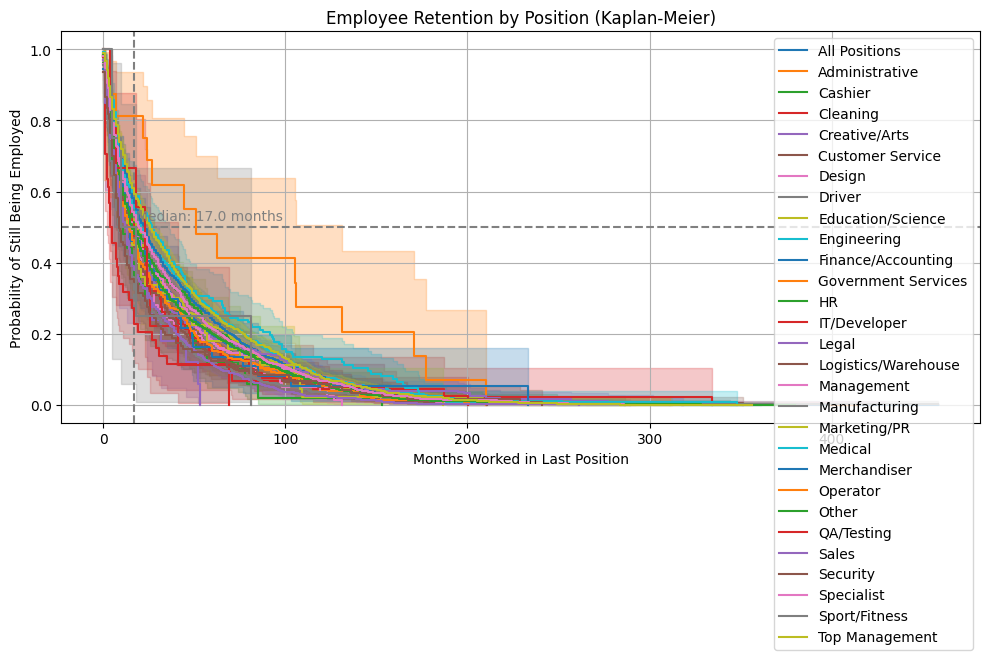

In [ ]:

df = df.dropna(subset=['months_worked_last_job', 'last_job_ended'])

import pandas as pd
import matplotlib.pyplot as plt
from lifelines import KaplanMeierFitter


df['months_worked_last_job'] = pd.to_numeric(df['months_worked_last_job'], errors='coerce')
df['last_job_ended'] = pd.to_numeric(df['last_job_ended'], errors='coerce')


df_clean = df.dropna(subset=['months_worked_last_job', 'last_job_ended'])


plt.figure(figsize=(10, 6))
kmf = KaplanMeierFitter()


kmf.fit(
    durations=df_clean['months_worked_last_job'],
    event_observed=df_clean['last_job_ended'],
    label='All Positions'
)
kmf.plot_survival_function()


median_survival = kmf.median_survival_time_
plt.axhline(y=0.5, color='gray', linestyle='--')
plt.axvline(x=median_survival, color='gray', linestyle='--')
plt.text(x=median_survival+1, y=0.52,
         s=f'Median: {median_survival:.1f} months',
         color='gray')


if 'position_category' in df_clean.columns:
    ax = plt.subplot(111)
    for name, grouped_df in df_clean.groupby('position_category'):
        grouped_df = grouped_df.dropna(subset=['months_worked_last_job', 'last_job_ended'])
        if not grouped_df.empty:
            kmf.fit(
                durations=grouped_df['months_worked_last_job'],
                event_observed=grouped_df['last_job_ended'],
                label=name
            )
            kmf.plot_survival_function(ax=ax)

plt.title('Employee Retention by Position (Kaplan-Meier)')
plt.xlabel('Months Worked in Last Position')
plt.ylabel('Probability of Still Being Employed')
plt.grid(True)
plt.tight_layout()
plt.show()



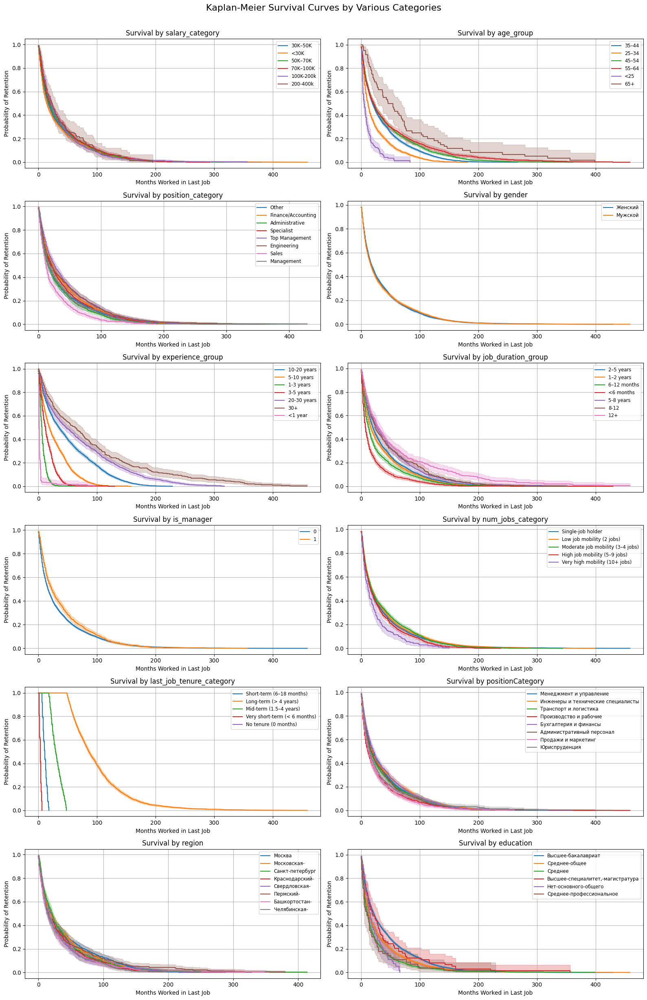

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from lifelines import KaplanMeierFitter

# Clean and prepare
df['months_worked_last_job'] = pd.to_numeric(df['months_worked_last_job'], errors='coerce')
df['last_job_ended'] = pd.to_numeric(df['last_job_ended'], errors='coerce')
df_clean = df.dropna(subset=['months_worked_last_job', 'last_job_ended'])

# Parameters
group_vars = [
    'salary_category', 'age_group', 'position_category', 'gender',
    'experience_group', 'job_duration_group', 'is_manager',
    'num_jobs_category', 'last_job_tenure_category', 'positionCategory', 'region', 'education'
]
min_group_size = 50
top_n_categories = 8

# Plot
n = len(group_vars)
cols = 2
rows = (n + 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 4), squeeze=False)
axes = axes.flatten()

for i, var in enumerate(group_vars):
    ax = axes[i]
    if var not in df_clean.columns:
        ax.set_visible(False)
        continue

    kmf = KaplanMeierFitter()
    group_counts = df_clean[var].value_counts()
    valid_groups = group_counts[group_counts >= min_group_size].nlargest(top_n_categories).index

    for name in valid_groups:
        grouped_df = df_clean[df_clean[var] == name]
        if not grouped_df.empty:
            kmf.fit(
                durations=grouped_df['months_worked_last_job'],
                event_observed=grouped_df['last_job_ended'],
                label=str(name)
            )
            kmf.plot_survival_function(ax=ax)

    ax.set_title(f'Survival by {var}', fontsize=12)
    ax.set_xlabel('Months Worked in Last Job')
    ax.set_ylabel('Probability of Retention')
    ax.grid(True)
    ax.legend(fontsize='small')


plt.tight_layout()
plt.suptitle('Kaplan-Meier Survival Curves by Various Categories', fontsize=16, y=1.02)
plt.show()


In [31]:
print(df.columns.tolist())
df['positionName'].describe()


['id', 'localityName', 'birthday', 'gender', 'age', 'positionName', 'dateCreate', 'dateModify', 'publishedDate', 'skills', 'driveLicenses', 'experience', 'country', 'educationList', 'additionalEducationList', 'hardSkills', 'softSkills', 'workExperienceList', 'scheduleType', 'salary', 'retrainingCapability', 'businessTrip', 'languageKnowledge', 'relocation', 'innerInfo', 'education', 'region', 'years_since_graduation', 'first_job_start_months_ago', 'total_experience_years_calc', 'current_job_duration_months', 'avg_job_duration_months', 'job_change_frequency', 'career_gaps_count', 'is_manager', 'num_jobs', 'position_1_title', 'position_1_company', 'position_1_start_months_ago', 'position_1_end_months_ago', 'position_1_duration_months', 'position_2_title', 'position_2_company', 'position_2_start_months_ago', 'position_2_end_months_ago', 'position_2_duration_months', 'position_3_title', 'position_3_company', 'position_3_start_months_ago', 'position_3_end_months_ago', 'position_3_duration_m

count         11632
unique         5146
top       Бухгалтер
freq            366
Name: positionName, dtype: object

In [32]:
unique_positions = df['positionName'].dropna().unique()
print(f"Total unique positions: {len(unique_positions)}")
for pos in sorted(unique_positions):
    print(pos)

Total unique positions: 5146
(-татарский-язык-и-литература)Филолог-преподаватель
(специалиста)-по-эксплуатации-и-ремонту-зданий
-
-Менеджер,-специалист,-водитель-
.
0ператор-линий
1
1.-Инженер-сотовой-связи---установка-и-проведение-работ-по-обслуживанию-оборудования-сотовых-сетей.-2.-Специалист-по-технической-защите-информации.
1С-Разработчик-(Junior)
1инженер-по-технике-безопасности
2
2d-дизайнер
2d-художник
3-механик
3D-художник
3d-визуализатор
:-бухгалтер-по-заработной-плате,-бухгалтер-–-кассир,-экономист-по-заработной-плате,-инспектор-по-кадрам,-менеджер,-заведующий-кассой,-др.
Backend-PHP7/MySQL/PostgreeSQL/JS-Developer.-Git/Phinx/UnitTests/Docker
Backend-разработчик-(PHP)
Business-development-manager
CG-Художник
Cпециалист
Cпециалист,-Менеджер
Cпециалист-по-договорной-работе
Cпециалист-по-кадрам
Cпециалист-по-регистрации-специалист-по-кадрам-секретарь-руководителя
Cпециалист-технической-поддержки
Data-Science,-ML-Developer
DevOps-инженер
Event--менеджер
Event-менеджер
FMCG,-Товар

In [33]:
df[df['position_category'] == 'Other'] \
    .sort_values(by='months_worked_last_job', ascending=False) \
    .loc[:, ['positionName', 'months_worked_last_job']] \
    .head(15)



,positionName,months_worked_last_job
35654,по-специальности,379.960578
26800,горничная,328.318003
32914,тренер-групповых-программ;-инструктор-по-подго...,302.989488
21619,Столяр,254.960578
35583,Консультант,251.971091
13640,любая,232.950066
29119,Мастер-участка,228.383706
36370,Мастер,220.926413
20455,поиск-подходящей-вакансии;,218.922470
24252,Штамповщик,211.990802


In [34]:
df['early_turnover'] = ((df['last_job_ended'] == 1) & (df['months_worked_last_job'] <= 6)).astype(int)
df['left_within_3_months'] = ((df['last_job_ended'] == 1) & (df['months_worked_last_job'] <= 3)).astype(int)


In [35]:
pip install tabulate

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import statsmodels.api as sm
from patsy import dmatrices
from statsmodels.discrete.discrete_model import Probit
from tabulate import tabulate


model_specs = {
    "Model_1": ["salary"],
    "Model_2": ["salary", "age"],
    "Model_3": ["salary", "age", "total_experience_years_calc"],
    "Model_4": ["salary", "age", "total_experience_years_calc", "avg_job_duration_months"],
    "Model_5": ["salary", "age", "total_experience_years_calc", "avg_job_duration_months", "job_change_frequency"],
    "Full_Model": ["salary", "age", "total_experience_years_calc", "avg_job_duration_months",
                   "job_change_frequency", "current_job_duration_months", "career_gaps_count", "num_jobs", "region", "education"]
}


model_results = []

for name, predictors in model_specs.items():
    try:
        df_model = df[["early_turnover"] + predictors].dropna()
        y, X = dmatrices(f"early_turnover ~ {' + '.join(predictors)}", data=df_model, return_type='dataframe')
        
        model = Probit(y, X).fit(cov_type='HC1', disp=False)  
        
        model_results.append({
            "Model": name,
            "N": int(model.nobs),
            "AIC": round(model.aic, 2),
            "BIC": round(model.bic, 2),
            "Pseudo R²": round(model.prsquared, 4),
            "LR test p": round(model.llr_pvalue, 4)
        })

        print(f"\n=== {name} ===")
        print(model.summary())
    
    except Exception as e:
        print(f"❌ Failed to run {name}: {e}")


print("\n📊 === Model Comparison Table ===")
print(tabulate(model_results, headers="keys", tablefmt="fancy_grid"))



=== Model_1 ===
                          Probit Regression Results                           
Dep. Variable:         early_turnover   No. Observations:                11635
Model:                         Probit   Df Residuals:                    11633
Method:                           MLE   Df Model:                            1
Date:                Tue, 13 May 2025   Pseudo R-squ.:                0.004311
Time:                        23:59:13   Log-Likelihood:                -6456.2
converged:                       True   LL-Null:                       -6484.2
Covariance Type:                  HC1   LLR p-value:                 7.599e-14
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.5513      0.023    -23.600      0.000      -0.597      -0.506
salary     -3.133e-06   4.56e-07     -6.874      0.000   -4.03e-06   -2.24e-06

=== Model_2 ===
                  

/Users/nikita/Library/Python/3.9/lib/python/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [ ]:
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import Probit
from statsmodels.tools import add_constant


X_vars = ['salary', 'age', 'total_experience_years_calc', 'avg_job_duration_months',
          'job_change_frequency', 'current_job_duration_months', 
          'career_gaps_count', 'num_jobs']


df_model = df[X_vars + ['early_turnover']].dropna()


X = add_constant(df_model[X_vars])
y = df_model['early_turnover']


probit = Probit(y, X)
probit_fit = probit.fit(cov_type='HC1')


mfx = probit_fit.get_margeff(at='mean', method='dydx')
print(mfx.summary())


Optimization terminated successfully.
         Current function value: 0.536462
         Iterations 5
       Probit Marginal Effects       
Dep. Variable:         early_turnover
Method:                          dydx
At:                              mean
                                 dy/dx    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
salary                      -6.875e-07   1.37e-07     -5.010      0.000   -9.56e-07   -4.19e-07
age                            -0.0031      0.001     -6.142      0.000      -0.004      -0.002
total_experience_years_calc    -0.0040      0.001     -3.335      0.001      -0.006      -0.002
avg_job_duration_months         0.0012      0.000      4.253      0.000       0.001       0.002
job_change_frequency            0.0220      0.003      7.855      0.000       0.016       0.027
current_job_duration_months    -0.0012      0.000     -6.085      0.000   

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.discrete.discrete_model import Probit
from statsmodels.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import het_breuschpagan
import numpy as np


X_vars = ['salary', 'age', 'total_experience_years_calc', 'avg_job_duration_months',
          'job_change_frequency', 'current_job_duration_months', 
          'career_gaps_count', 'num_jobs']

df_model = df[X_vars + ['early_turnover']].dropna()
X = add_constant(df_model[X_vars])
y = df_model['early_turnover']


probit_model = Probit(y, X).fit()


vif_df = pd.DataFrame()
vif_df["Variable"] = X.columns
vif_df["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print("=== VIF (Multicollinearity Check) ===")
print(vif_df)


ols_model = sm.OLS(y, X).fit()
bp_test = het_breuschpagan(ols_model.resid, ols_model.model.exog)

labels = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
print("\n=== Breusch-Pagan Test (Heteroskedasticity Check) ===")
print(dict(zip(labels, bp_test)))


Optimization terminated successfully.
         Current function value: 0.536462
         Iterations 5
=== VIF (Multicollinearity Check) ===
                      Variable        VIF
0                        const  27.044397
1                       salary   1.036345
2                          age   1.378508
3  total_experience_years_calc   4.076410
4      avg_job_duration_months   7.149150
5         job_change_frequency   1.184707
6  current_job_duration_months   4.538404
7            career_gaps_count   2.644256
8                     num_jobs   4.583908

=== Breusch-Pagan Test (Heteroskedasticity Check) ===
{'Lagrange multiplier statistic': np.float64(333.8681117356768), 'p-value': np.float64(2.504794810944394e-67), 'f-value': np.float64(42.93768210470679), 'f p-value': np.float64(2.458468777138329e-68)}


In [ ]:
variables = [
    'position_category',
    'region',
    'education',
    'salary',
    'age',
    'total_experience_years_calc',
    'avg_job_duration_months',
    'job_change_frequency',
    'current_job_duration_months',
    'career_gaps_count',
    'num_jobs',
    'months_worked_last_job', 
    'early_turnover'           
]


In [ ]:
from lifelines import CoxPHFitter

df_encoded = pd.get_dummies(df[variables], drop_first=True)


df_model = df_encoded.dropna()

# Fit Cox model
cph = CoxPHFitter()
cph.fit(df_model, duration_col='months_worked_last_job', event_col='early_turnover')
cph.print_summary()


/Users/nikita/Library/Python/3.9/lib/python/site-packages/lifelines/utils/__init__.py:1100: ConvergenceWarning: Column(s) ['region_Анадырь', 'region_Билибино', 'region_Луганская-народная-', 'education_Незаконченное-высшее'] have very low variance. This may harm convergence. 1) Are you using formula's? Did you mean to add '-1' to the end. 2) Try dropping this redundant column before fitting if convergence fails.

  warnings.warn(dedent(warning_text), ConvergenceWarning)


<lifelines.CoxPHFitter: fitted with 11593 total observations, 8760 right-censored observations>
             duration col = 'months_worked_last_job'
                event col = 'early_turnover'
      baseline estimation = breslow
   number of observations = 11593
number of events observed = 2833
   partial log-likelihood = -25774.69
         time fit was run = 2025-05-13 20:59:14 UTC

---
                                                         coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                                                                
salary                                                  -0.00      1.00      0.00           -0.00           -0.00                1.00                1.00
age                                                     -0.02      0.98      0.00           -0.02           -0.01                0.98                0.99
total_experience_years_calc                             -0.01      0.99      0.01           -0.02           -0.00                0.98                1.00
avg_job_duration_months                                  0.01      1.01      0.00            0.00            0.01                1.00                1.01
job_change_frequency                                     0.06      1.07      0.01            0.05            0.08                1.05                1.08
current_job_duration_months                             -0.01      0.99      0.00           -0.01           -0.00                0.99                1.00
career_gaps_count                                        0.07      1.07      0.02            0.02            0.11                1.02                1.12
num_jobs                                                 0.03      1.03      0.02           -0.01            0.06                0.99                1.06
position_category_Cashier                                0.31      1.36      0.25           -0.19            0.80                0.83                2.23
position_category_Cleaning                               1.15      3.17      0.22            0.72            1.59                2.05                4.89
position_category_Creative/Arts                          0.23      1.25      0.41           -0.59            1.04                0.56                2.82
position_category_Customer Service                       0.07      1.07      0.13           -0.19            0.33                0.83                1.39
position_category_Design                                 0.19      1.20      0.20           -0.21            0.58                0.81                1.79
position_category_Driver                                 0.05      1.05      0.13           -0.20            0.29                0.82                1.34
position_category_Education/Science                      0.04      1.04      0.12           -0.20            0.27                0.82                1.31
position_category_Engineering                           -0.05      0.95      0.10           -0.24            0.14                0.78                1.15
position_category_Finance/Accounting                    -0.13      0.88      0.09           -0.31            0.05                0.74                1.05
position_category_Government Services                   -0.50      0.60      0.71           -1.90            0.89                0.15                2.44
position_category_HR                                     0.15      1.16      0.13           -0.11            0.41                0.89                1.50
position_category_IT/Developer                           0.12      1.13      0.22           -0.30            0.54                0.74                1.72
position_category_Legal                                  0.17      1.19      0.13           -0.07            0.42                0.93                1.52
position_category_Logistics/Warehouse                    0.22     

In [ ]:
from lifelines.statistics import proportional_hazard_test


results_ph = proportional_hazard_test(cph, df_model, time_transform='rank')
print(results_ph.summary)


                              test_statistic         p  -log2(p)
age                                 8.499413  0.003553  8.136905
avg_job_duration_months             0.070015  0.791314  0.337677
career_gaps_count                   0.875195  0.349521  1.516549
current_job_duration_months         1.098179  0.294666  1.762847
education_Высшее-бакалавриат        4.454325  0.034813  4.844232
...                                      ...       ...       ...
region_Челябинская-                 8.656550  0.003259  8.261409
region_Чеченская-                   0.022051  0.881950  0.181231
region_Ярославская-                 7.209797  0.007251  7.107670
salary                              0.191634  0.661560  0.596055
total_experience_years_calc         0.944694  0.331074  1.594776

[140 rows x 3 columns]


In [ ]:

residuals_df = cph.compute_residuals(df_model, kind='martingale')


print(residuals_df.columns)


df_model['resid_martingale'] = residuals_df.iloc[:, 0]  


Index(['months_worked_last_job', 'early_turnover', 'martingale'], dtype='object')


/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/45835256.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_model['resid_martingale'] = residuals_df.iloc[:, 0]  # or use .loc[:, 'baseline'] if present


In [44]:
pip install statsmodels

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


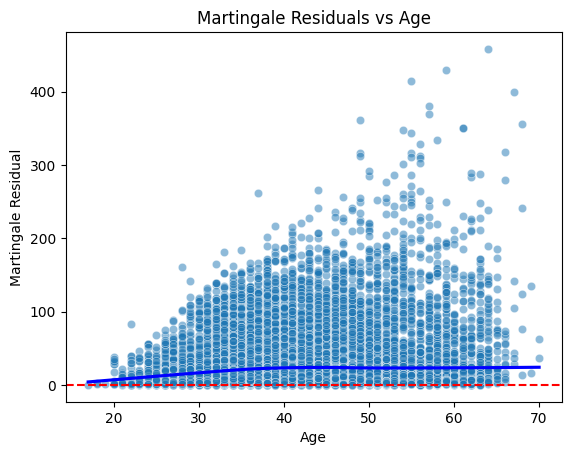

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(x='age', y='resid_martingale', data=df_model, alpha=0.5)
sns.regplot(x='age', y='resid_martingale', data=df_model,
            scatter=False, lowess=True, color='blue')
plt.title("Martingale Residuals vs Age")
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Age")
plt.ylabel("Martingale Residual")
plt.show()


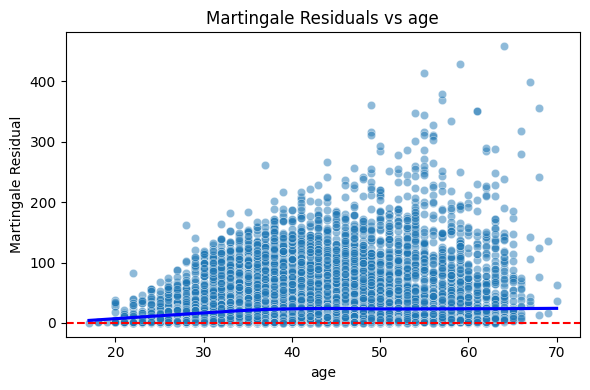

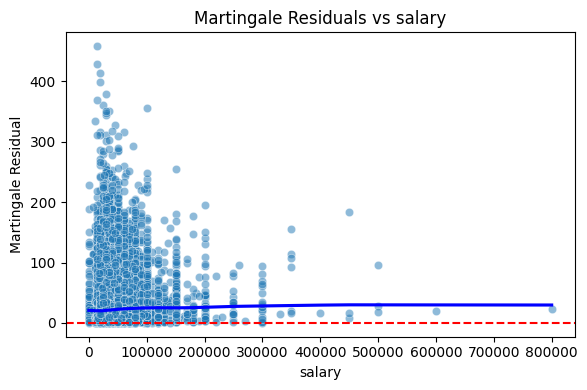

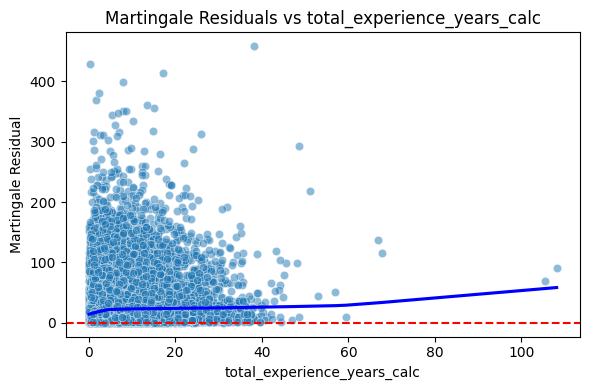

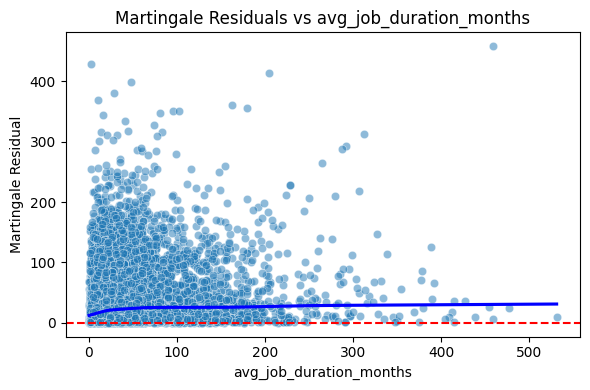

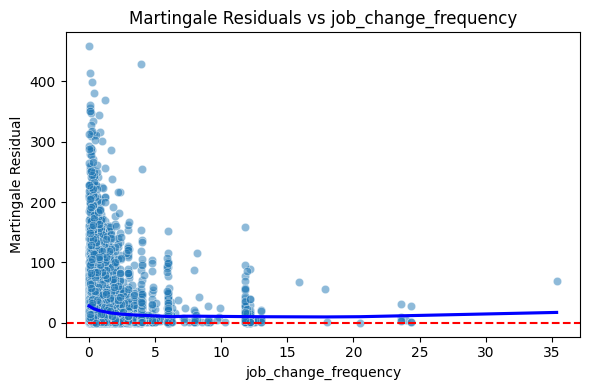

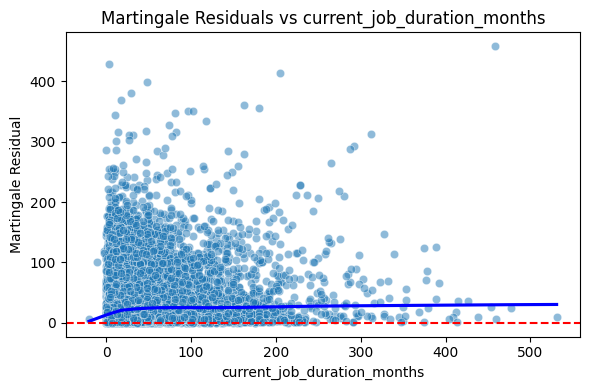

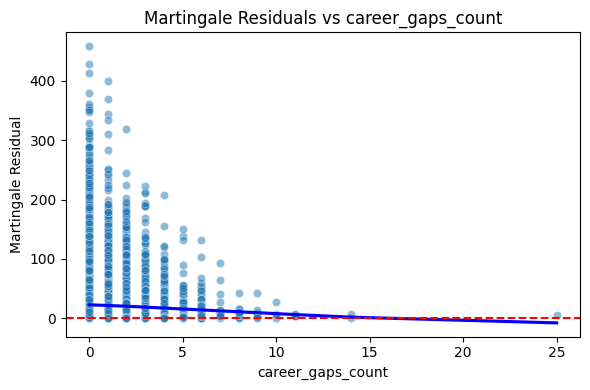

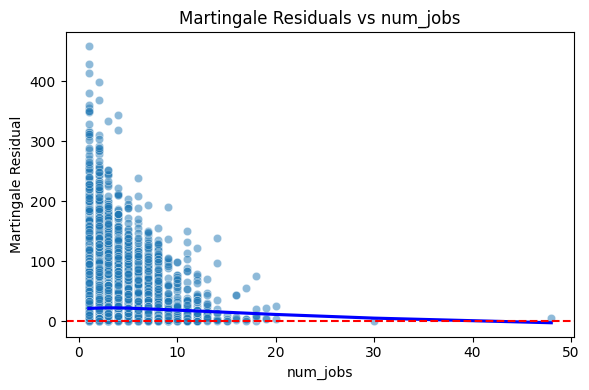

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


df_model = df_model.drop(columns=['resid_martingale'], errors='ignore')


resid = cph.compute_residuals(df_model, kind='martingale')


if isinstance(resid, pd.DataFrame):
    if resid.shape[1] == 1:
        df_model['resid_martingale'] = resid.squeeze()
    else:
        df_model['resid_martingale'] = resid.iloc[:, 0]  
else:
    df_model['resid_martingale'] = resid


variables_to_check = [
    'age', 
    'salary', 
    'total_experience_years_calc', 
    'avg_job_duration_months',
    'job_change_frequency', 
    'current_job_duration_months', 
    'career_gaps_count', 
    'num_jobs'
]


for var in variables_to_check:
    plt.figure(figsize=(6, 4))
    sns.scatterplot(x=var, y='resid_martingale', data=df_model, alpha=0.5)
    sns.regplot(x=var, y='resid_martingale', data=df_model,
                scatter=False, lowess=True, color='blue')
    plt.axhline(0, color='red', linestyle='--')
    plt.title(f"Martingale Residuals vs {var}")
    plt.xlabel(var)
    plt.ylabel("Martingale Residual")
    plt.tight_layout()
    plt.show()


In [ ]:
from lifelines import CoxPHFitter
import pandas as pd


model_vars = {
    'Model_1': ['salary', 'age'],
    'Model_2': ['salary', 'age', 'num_jobs'],
    'Model_3': ['salary', 'age', 'num_jobs', 'career_gaps_count'],
    'Model_4': ['salary', 'age', 'num_jobs', 'career_gaps_count', 'job_change_frequency'],
    'Model_5_Full': [
        'salary', 'age', 'total_experience_years_calc', 'avg_job_duration_months',
        'job_change_frequency', 'current_job_duration_months', 'career_gaps_count',
        'num_jobs', 'region', 'education'
    ]
}

results = []

for name, vars_subset in model_vars.items():
 
    df_temp = df[vars_subset + ['months_worked_last_job', 'early_turnover']].dropna()

    
    categorical_cols = [col for col in ['region', 'education'] if col in df_temp.columns]

   
    if categorical_cols:
        df_temp = pd.get_dummies(df_temp, columns=categorical_cols, drop_first=True)

  
    cph = CoxPHFitter()
    cph.fit(df_temp, duration_col='months_worked_last_job', event_col='early_turnover')

    results.append({
        'Model': name,
        'Variables': vars_subset,
        'Concordance Index': cph.concordance_index_,
        'Log-Likelihood': cph.log_likelihood_,
        'AIC': cph.AIC_partial_
    })


results_df = pd.DataFrame(results).sort_values(by='Concordance Index', ascending=False)
print(results_df)


          Model                                          Variables  \
4  Model_5_Full  [salary, age, total_experience_years_calc, avg...   
3       Model_4  [salary, age, num_jobs, career_gaps_count, job...   
2       Model_3         [salary, age, num_jobs, career_gaps_count]   
1       Model_2                            [salary, age, num_jobs]   
0       Model_1                                      [salary, age]   

   Concordance Index  Log-Likelihood           AIC  
4           0.630657   -24364.330878  48954.661756  
3           0.601031   -25941.747509  51893.495017  
2           0.586423   -26213.915980  52435.831960  
1           0.581116   -26231.059848  52468.119695  
0           0.572570   -26249.398925  52502.797850  


In [ ]:
import pandas as pd
from lifelines import CoxPHFitter

model_vars = {
    'Model_1': ['salary', 'age'],
    'Model_2': ['salary', 'age', 'num_jobs'],
    'Model_3': ['salary', 'age', 'num_jobs', 'career_gaps_count'],
    'Model_4': ['salary', 'age', 'num_jobs', 'career_gaps_count', 'job_change_frequency'],
    'Model_5_Full': [
        'salary',
        'age',
        'total_experience_years_calc',
        'avg_job_duration_months',
        'job_change_frequency',
        'current_job_duration_months',
        'career_gaps_count',
        'num_jobs'
    ]
}

results = {}

for name, vars_subset in model_vars.items():
    df_temp = df[vars_subset + ['months_worked_last_job', 'early_turnover']].dropna()
    cph = CoxPHFitter()
    cph.fit(df_temp, duration_col='months_worked_last_job', event_col='early_turnover')
    
    summary = cph.summary
    
    def significance_marker(p):
        if p < 0.01:
            return '***'
        elif p < 0.05:
            return '**'
        elif p < 0.1:
            return '*'
        else:
            return ''
    
    coef_with_sig = summary['coef'].round(3).astype(str) + summary['p'].apply(significance_marker)
    results[name] = coef_with_sig


coef_comparison_df = pd.DataFrame(results).fillna('')


print(coef_comparison_df)


                               Model_1    Model_2    Model_3   Model_4  \
covariate                                                                
age                          -0.024***  -0.026***  -0.026***  -0.02***   
avg_job_duration_months                                                  
career_gaps_count                                   0.131***  0.118***   
current_job_duration_months                                              
job_change_frequency                                           0.08***   
num_jobs                                 0.049***     -0.014    -0.008   
salary                         -0.0***    -0.0***    -0.0***   -0.0***   
total_experience_years_calc                                              

                            Model_5_Full  
covariate                                 
age                            -0.015***  
avg_job_duration_months         0.005***  
career_gaps_count               0.095***  
current_job_duration_months    -0.007***  
j

In [49]:
#pip install sklearn

In [ ]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import classification_report
import numpy as np


features = ['salary', 'age', 'total_experience_years_calc',
            'avg_job_duration_months', 'job_change_frequency',
            'current_job_duration_months', 'career_gaps_count', 'num_jobs']

X = df[features].dropna()
y = df.loc[X.index, 'early_turnover']  


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


hyperparams = [
    {'max_depth': 3, 'min_samples_split': 10},
    {'max_depth': 5, 'min_samples_split': 5},
    {'max_depth': 7, 'min_samples_split': 2},
    {'max_depth': None, 'min_samples_split': 2}, 
]


results = []

for params in hyperparams:
    clf = DecisionTreeClassifier(**params, random_state=42)
    scores = cross_val_score(clf, X_train, y_train, cv=5, scoring='accuracy')
    results.append({
        'params': params,
        'mean_accuracy': scores.mean(),
        'std_accuracy': scores.std()
    })


results_df = pd.DataFrame(results).sort_values(by='mean_accuracy', ascending=False)
print(results_df)


best_params = results_df.iloc[0]['params']
best_clf = DecisionTreeClassifier(**best_params, random_state=42)
best_clf.fit(X_train, y_train)


y_pred = best_clf.predict(X_test)
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))


                                        params  mean_accuracy  std_accuracy
0    {'max_depth': 3, 'min_samples_split': 10}       0.757602      0.000979
1     {'max_depth': 5, 'min_samples_split': 5}       0.752750      0.004958
2     {'max_depth': 7, 'min_samples_split': 2}       0.749083      0.007728
3  {'max_depth': None, 'min_samples_split': 2}       0.651066      0.006815

Classification Report:

              precision    recall  f1-score   support

           0       0.76      0.99      0.86      1751
           1       0.47      0.02      0.03       568

    accuracy                           0.75      2319
   macro avg       0.62      0.51      0.45      2319
weighted avg       0.69      0.75      0.66      2319



In [51]:
#pip install streamlit

In [ ]:
import pandas as pd
from lifelines import CoxPHFitter


all_columns = df_model.drop(columns=['months_worked_last_job', 'early_turnover']).columns.tolist()


region_columns = [col for col in all_columns if col.startswith('region_')]
education_columns = [col for col in all_columns if col.startswith('education_')]


region_options = [col.replace('region_', '') for col in region_columns]
education_options = [col.replace('education_', '') for col in education_columns]


print("=== EMPLOYEE TURNOVER RISK CALCULATOR ===\n")

salary = float(input("Salary: "))
age = int(input("Age: "))
total_exp = float(input("Total experience (years): "))
avg_job_duration = float(input("Average job duration (months): "))
job_change_freq = float(input("Job change frequency (per year): "))
current_job_duration = float(input("Current job duration (months): "))
career_gaps = int(input("Career gaps count: "))
num_jobs = int(input("Number of jobs: "))
months_ahead = int(input("Predict turnover within how many months? (e.g., 12): "))

print("\nAvailable Regions:")
print(region_options)
region = input("Region (type exactly from above): ")

print("\nAvailable Education Levels:")
print(education_options)
education = input("Education (type exactly from above): ")


input_data = {
    'salary': salary,
    'age': age,
    'total_experience_years_calc': total_exp,
    'avg_job_duration_months': avg_job_duration,
    'job_change_frequency': job_change_freq,
    'current_job_duration_months': current_job_duration,
    'career_gaps_count': career_gaps,
    'num_jobs': num_jobs
}


input_df = pd.DataFrame([input_data])


for col in region_columns + education_columns:
    input_df[col] = 0
if f'region_{region}' in region_columns:
    input_df[f'region_{region}'] = 1
if f'education_{education}' in education_columns:
    input_df[f'education_{education}'] = 1


input_df = input_df[all_columns]


survival_function = cph.predict_survival_function(input_df).squeeze()

if months_ahead in survival_function.index:
    survival_prob = survival_function.loc[months_ahead]
else:
    survival_prob = survival_function.iloc[-1]

turnover_risk = 1 - survival_prob


print("\n=== RESULTS ===")
print(f"Estimated probability of staying: {survival_prob:.2%}")
print(f"Estimated risk of turnover in next {months_ahead} months: {turnover_risk:.2%}")



=== EMPLOYEE TURNOVER RISK CALCULATOR ===


Available Regions:
['---чувашия', '--югра-автономный-округ', 'Адыгея-', 'Алтай-', 'Алтайский-', 'Амурская-', 'Анадырь', 'Архангельская-', 'Астраханская-', 'Байконур', 'Башкортостан-', 'Белгородская-', 'Билибино', 'Брянская-', 'Бурятия-', 'Владимирская-', 'Волгоградская-', 'Вологодская-', 'Воронежская-', 'Губкинский', 'Дагестан-', 'Донецкая-народная-', 'Еврейская-автономная-', 'Забайкальский-', 'Ивановская-', 'Ингушетия-', 'Иркутская-', 'Кабардино-балкарская-', 'Калининградская-', 'Калмыкия-', 'Калужская-', 'Камчатский-', 'Карачаево-черкесская-', 'Карелия-', 'Кемеровская-', 'Кировская-', 'Коми-', 'Костромская-', 'Краснодарский-', 'Красноярский-', 'Крым-', 'Курганская-', 'Курская-', 'Лабытнанги', 'Ленинградская-', 'Липецкая-', 'Луганская-народная-', 'Магаданская-', 'Марий-эл-', 'Мордовия-', 'Москва', 'Московская-', 'Муравленко', 'Мурманская-', 'Надым', 'Нарьян-мар', 'Неизвестно', 'Нижегородская-', 'Новгородская-', 'Новосибирская-', 'Новый-уренг

/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/329780399.py:56: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  input_df[col] = 0
/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/329780399.py:56: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  input_df[col] = 0
/var/folders/5l/h64trng118s0zqqq9x12dm8r0000gp/T/ipykernel_4442/329780399.py:56: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining

KeyError: "['position_category_Cashier', 'position_category_Cleaning', 'position_category_Creative/Arts', 'position_category_Customer Service', 'position_category_Design', 'position_category_Driver', 'position_category_Education/Science', 'position_category_Engineering', 'position_category_Finance/Accounting', 'position_category_Government Services', 'position_category_HR', 'position_category_IT/Developer', 'position_category_Legal', 'position_category_Logistics/Warehouse', 'position_category_Management', 'position_category_Manufacturing', 'position_category_Marketing/PR', 'position_category_Medical', 'position_category_Merchandiser', 'position_category_Operator', 'position_category_Other', 'position_category_QA/Testing', 'position_category_Sales', 'position_category_Security', 'position_category_Specialist', 'position_category_Sport/Fitness', 'position_category_Top Management', 'resid_martingale'] not in index"

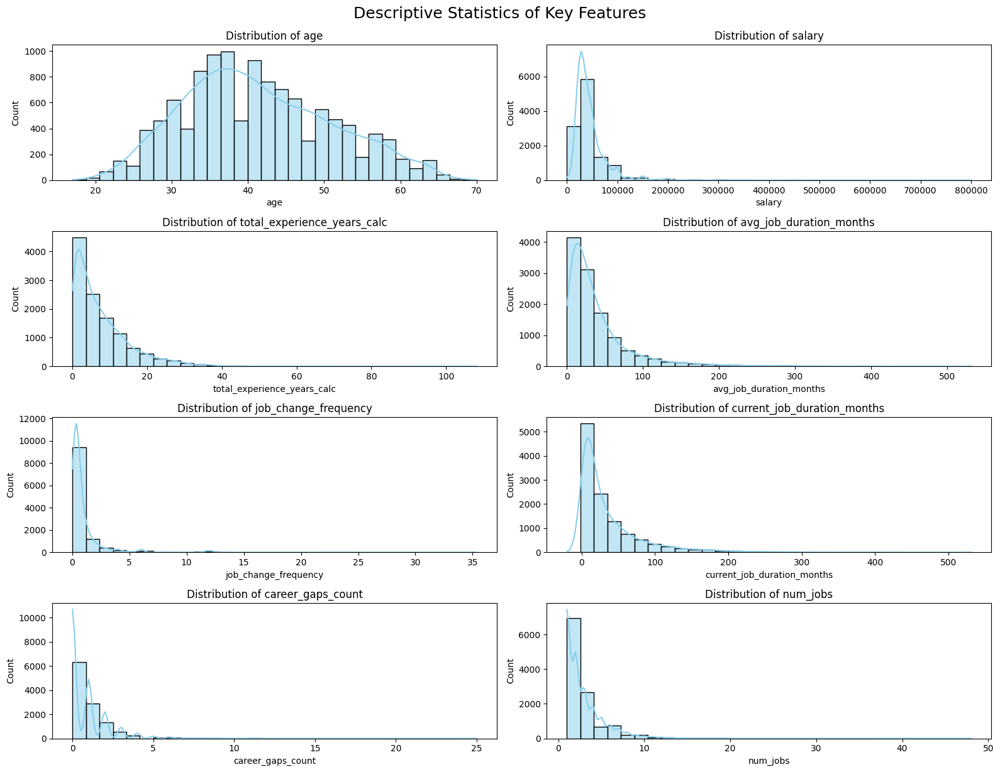

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


numeric_vars = [
    'age', 
    'salary', 
    'total_experience_years_calc', 
    'avg_job_duration_months', 
    'job_change_frequency', 
    'current_job_duration_months', 
    'career_gaps_count', 
    'num_jobs'
]


df_plot = df[numeric_vars].dropna()


plt.figure(figsize=(16, 12))
for i, var in enumerate(numeric_vars):
    plt.subplot(4, 2, i + 1)
    sns.histplot(df_plot[var], kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.tight_layout()

plt.suptitle('Descriptive Statistics of Key Features', fontsize=18, y=1.02)
plt.show()


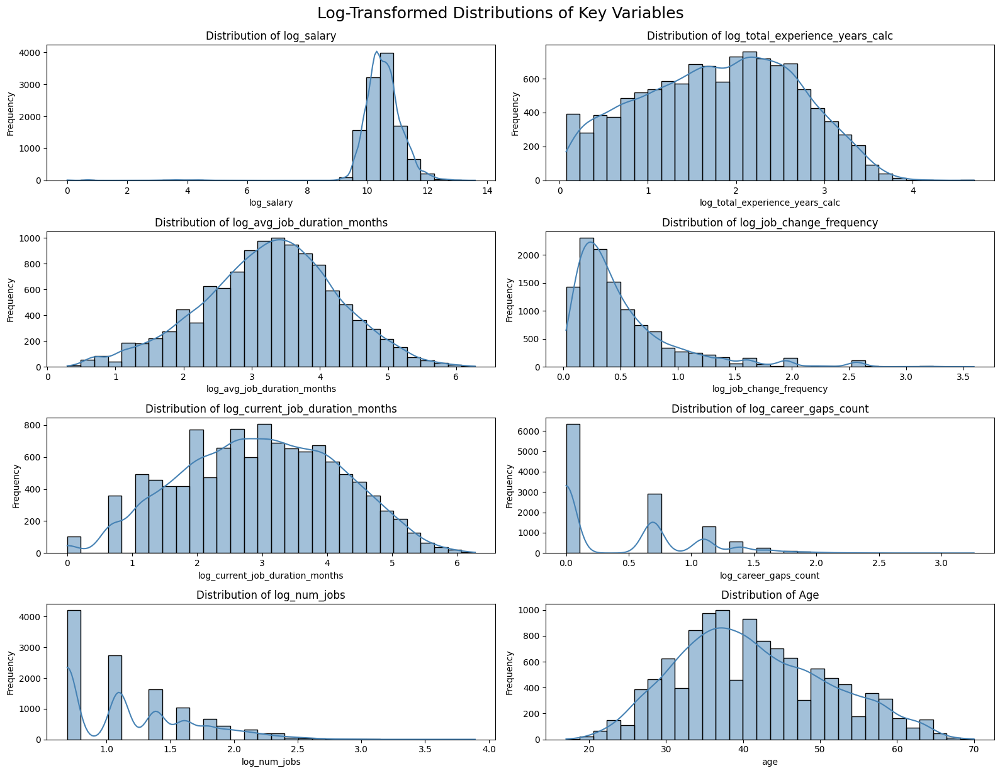

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


numeric_vars = [
    'salary', 
    'total_experience_years_calc', 
    'avg_job_duration_months', 
    'job_change_frequency', 
    'current_job_duration_months', 
    'career_gaps_count', 
    'num_jobs'
]


df_log = df.copy()
for var in numeric_vars:
    df_log[f'log_{var}'] = np.log1p(df_log[var])


plot_vars = [f'log_{var}' for var in numeric_vars] + ['age']
df_plot = df_log[plot_vars].dropna()


plt.figure(figsize=(16, 12))
for i, var in enumerate(plot_vars):
    plt.subplot(4, 2, i + 1)
    sns.histplot(df_plot[var], kde=True, bins=30, color='steelblue')
    plt.title(f'Distribution of {"Age" if var == "age" else var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.tight_layout()

plt.suptitle('Log-Transformed Distributions of Key Variables', fontsize=18, y=1.02)
plt.show()


In [ ]:
import pandas as pd


desc_vars = [
    'salary',
    'age',
    'total_experience_years_calc',
    'avg_job_duration_months',
    'job_change_frequency',
    'current_job_duration_months',
    'career_gaps_count',
    'num_jobs'
]


desc_stats = df[desc_vars].dropna()


summary_table = desc_stats.describe(percentiles=[.25, .5, .75]).T.rename(columns={
    '25%': 'Q1',
    '50%': 'Median',
    '75%': 'Q3'
})


summary_table = summary_table[['mean', 'std', 'min', 'Q1', 'Median', 'Q3', 'max']].round(2)


print("Descriptive Statistics Table:\n")
print(summary_table)




📊 Descriptive Statistics Table:

                                 mean       std    min        Q1    Median  \
salary                       45232.09  34159.43   0.00  25000.00  35000.00   
age                             41.30      9.70  17.00     34.00     40.00   
total_experience_years_calc      7.65      7.53   0.08      2.08      5.25   
avg_job_duration_months         40.08     45.32   0.34     13.00     26.33   
job_change_frequency             0.96      1.75   0.02      0.24      0.46   
current_job_duration_months     37.33     49.39 -20.07      7.00     18.96   
career_gaps_count                0.83      1.28   0.00      0.00      0.00   
num_jobs                         2.79      2.33   1.00      1.00      2.00   

                                   Q3        max  
salary                       50000.00  800000.00  
age                             48.00      70.00  
total_experience_years_calc     10.90     108.14  
avg_job_duration_months         49.20     530.95  
job_chang

In [ ]:
#pip install lifelines scikit-learn


Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from lifelines import CoxPHFitter
from lifelines.utils import concordance_index
LogisticRegression(max_iter=1000)

features = [
    'salary', 'age', 'total_experience_years_calc', 'avg_job_duration_months',
    'job_change_frequency', 'current_job_duration_months',
    'career_gaps_count', 'num_jobs'
]
event_col = 'early_turnover'
duration_col = 'months_worked_last_job'


df_clean = df[features + [event_col, duration_col]].dropna()
X = df_clean[features]
y = df_clean[event_col]
T = df_clean[duration_col]


X_train, X_test, y_train, y_test, T_train, T_test = train_test_split(X, y, T, test_size=0.2, random_state=42)


clf = LogisticRegression()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_proba = clf.predict_proba(X_test)[:, 1]
accuracy = accuracy_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_proba)

df_train_cox = X_train.copy()
df_train_cox[event_col] = y_train
df_train_cox[duration_col] = T_train

df_test_cox = X_test.copy()
df_test_cox[event_col] = y_test
df_test_cox[duration_col] = T_test

cph = CoxPHFitter()
cph.fit(df_train_cox, duration_col=duration_col, event_col=event_col)
partial_hazards = cph.predict_partial_hazard(df_test_cox)
cindex = concordance_index(T_test, -partial_hazards, y_test)


print("=== Probit (Logistic Regression) ===")
print(f"Accuracy: {accuracy:.3f}")
print(f"ROC AUC: {auc:.3f}")

print("\n=== Cox Proportional Hazards Model ===")
print(f"Concordance Index: {cindex:.3f}")


/Users/nikita/Library/Python/3.9/lib/python/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


=== Probit (Logistic Regression) ===
Accuracy: 0.755
ROC AUC: 0.599

=== Cox Proportional Hazards Model ===
Concordance Index: 0.603


In [ ]:
import pandas as pd
import numpy as np
from lifelines import CoxPHFitter
from sklearn.model_selection import KFold
from lifelines.utils import concordance_index
from sklearn.metrics import accuracy_score


model_vars = {
    'Model_1': ['age', 'salary'],
    'Model_2': ['age', 'salary', 'total_experience_years_calc'],
    'Model_3': ['age', 'salary', 'total_experience_years_calc', 'career_gaps_count'],
    'Model_4': ['age', 'salary', 'total_experience_years_calc', 'career_gaps_count', 'job_change_frequency'],
    'Model_5_Full': [
        'age',
        'salary',
        'total_experience_years_calc',
        'avg_job_duration_months',
        'job_change_frequency',
        'current_job_duration_months',
        'career_gaps_count',
        'num_jobs',
        'position_category',
        'region',
        'education'
    ]
}

duration_col = 'months_worked_last_job'
event_col = 'early_turnover'

def prepare_data(df, vars_subset):
    cols = vars_subset + [duration_col, event_col]
    df_subset = df[cols].dropna().copy()
    df_encoded = pd.get_dummies(df_subset, columns=[col for col in vars_subset if df[col].dtype == 'object'], drop_first=True)
    return df_encoded

results = []
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for model_name, variables in model_vars.items():
    c_indices = []
    accuracies = []

    for train_idx, test_idx in kf.split(df):
        df_fold = df.iloc[train_idx]
        df_test = df.iloc[test_idx]

        df_train = prepare_data(df_fold, variables)
        df_val = prepare_data(df_test, variables)

        common_cols = df_train.columns.intersection(df_val.columns)
        df_train = df_train[common_cols]
        df_val = df_val[common_cols]

        try:
            cph = CoxPHFitter()
            cph.fit(df_train, duration_col=duration_col, event_col=event_col)

            pred_scores = cph.predict_partial_hazard(df_val)
            c_idx = concordance_index(df_val[duration_col], -pred_scores, df_val[event_col])
            c_indices.append(c_idx)

            median_time = df_val[duration_col].median()
            survival_probs = cph.predict_survival_function(df_val)
            survival_at_median = survival_probs.loc[median_time]
            pred_survive = (survival_at_median > 0.5).astype(int)
            true_survive = (df_val[event_col] == 0).astype(int)
            acc = accuracy_score(true_survive, pred_survive)
            accuracies.append(acc)

        except Exception as e:
            print(f"Model {model_name} failed on fold due to: {e}")
            continue

    results.append({
        'Model': model_name,
        'Avg C-Index': np.mean(c_indices),
        'Avg Accuracy': np.mean(accuracies)
    })

results_df = pd.DataFrame(results).sort_values(by='Avg C-Index', ascending=False)
print(results_df)


/Users/nikita/Library/Python/3.9/lib/python/site-packages/lifelines/fitters/coxph_fitter.py:1789: RuntimeWarning: overflow encountered in exp
  scores = weights * exp(dot(X, beta))
/Users/nikita/Library/Python/3.9/lib/python/site-packages/lifelines/fitters/coxph_fitter.py:1530: LinAlgWarning: Ill-conditioned matrix (rcond=0): result may not be accurate.
  inv_h_dot_g_T = spsolve(-h, g, assume_a="pos", check_finite=False)


⚠️ Model Model_5_Full failed on fold due to: delta contains nan value(s). Convergence halted. Please see the following tips in the lifelines documentation: https://lifelines.readthedocs.io/en/latest/Examples.html#problems-with-convergence-in-the-cox-proportional-hazard-model
          Model  Avg C-Index  Avg Accuracy
4  Model_5_Full     0.607354      0.762255
3       Model_4     0.603192      0.756747
2       Model_3     0.594353      0.755135
1       Model_2     0.577269      0.754534
0       Model_1     0.572519      0.754534
